## 1. Исследовательский анализ данных

В нашем датасете есть изображения, связанные с текстом, и мы должны определить, соответствует ли текст изображению. Для этого мы используем экспертные и краудсорсинговые оценки. Эксперты оценивают каждую пару изображение-текст, и мы должны агрегировать их оценки, чтобы получить единую оценку. Мы можем использовать метод голосования большинства или придумать свой метод.

Кроме того, у нас есть краудсорсинговые оценки, которые показывают долю исполнителей, подтвердивших, что текст соответствует изображению, количество исполнителей, подтвердивших это, и количество исполнителей, подтвердивших обратное.


После анализа обеих оценок мы должны выбрать одну из них или объединить их в одну по какому-то критерию. Наша модель должна возвращать вероятность соответствия изображения тексту, поэтому целевая переменная должна быть числом от 0 до 1. Если некоторые изображения нарушают законы стран, в которых мы работаем, мы должны удалить их из обучающей выборки.

In [ ]:
!pip install -q -U scikit-learn
!pip install -q -U transformers
!pip install -q tqdm boto3 requests regex sentencepiece sacremoses huggingface_hub


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 53.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 26.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 18.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 57.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 54.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.7/135.7 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 49.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 880.6/880.6 kB 57.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.0/11.0 MB 57.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 8.2 MB/s eta 0:00:00


Импорты проекта

In [ ]:
from google.colab import drive
from keras.preprocessing.image import ImageDataGenerator
from lightgbm import LGBMRegressor
import matplotlib.pyplot as plt
import nltk
from nltk.corpus import stopwords
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize
import numpy as np
import os
import pandas as pd
from PIL import Image
import plotly.express as px
import re
import scipy.spatial.distance
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import RandomizedSearchCV
import spacy
import tensorflow as tf
import torch
from torchvision.models import resnet50
import torchvision.transforms as T
from transformers import BertModel, BertTokenizer
from tqdm.notebook import tqdm
from tqdm import trange
from wordcloud import WordCloud
import zipfile

tf.random.set_seed(42)
torch.random.manual_seed(42)
np.random.seed(42)

In [ ]:
# Подключаю Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
DATA_PATH = '.../Practicum_Datasets/'

In [ ]:
zipfile.ZipFile("./dsplus_integrated_project_4.zip", mode="r").extractall(DATA_PATH)

### Загрузка данных

In [ ]:
train_df = pd.read_csv(os.path.join(DATA_PATH, 'train_dataset.csv'))
test_dfq = pd.read_csv(os.path.join(DATA_PATH, 'test_queries.csv'), sep='|', index_col=0)
test_dfi = pd.read_csv(os.path.join(DATA_PATH, 'test_images.csv'))
crowd_annots = pd.read_csv(os.path.join(DATA_PATH, 'CrowdAnnotations.tsv'), sep='\t', header=None)
crowd_annots = crowd_annots.rename(columns={0 : 'file_name', 1 : 'query_id', 2 : 'confirm_share', 3 : 'n_match', 4 : 'n_nomatch'})
expert_annots = pd.read_csv(os.path.join(DATA_PATH, 'ExpertAnnotations.tsv'), sep='\t', header=None)
expert_annots = expert_annots.rename(columns={0 : 'file_name', 1 : 'query_id', 2 : '1_expert', 3 : '2_expert', 4 : '3_expert'})

Данные загружены

### Первичный анализ данных

План анализа и предобработки данных:
* Визуальная оценка каждой таблицы или набора данных, вывод информации о таблице
* Проверка на наличие дубликатов
* Объединение таблиц экспертных и краудсорсинговых оценок и получение усредненных оценок для каждой пары фото/описания
* Предварительная обработка и исследование текстовых данных

Проведем первичное исследование загруженых датасетов:

**Исследование таблицы `train_df`**

In [ ]:
display(train_df.head())

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


`train_df` - таблица содержит тренировочный датасет со следующей информацией: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат _<имя файла изображения>#<порядковый номер описания>_.

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


В тренировочном датасете 3 столбца, 5822 строки с типами данных `object`. Явных пропусков нет.

Исследуем тренирвочную таблицу на дубликаты, поскольку их обилие может привести модели к переобучению и ложным прогнозам

In [ ]:
train_df = train_df.drop_duplicates()
print(train_df.duplicated(keep=False).sum())

0


Явных дубликатов нет

**Исследование таблицы `test_dfq`**

In [ ]:
display(test_dfq.head())

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


В таблице `test_dfq` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат _<имя файла изображения>#<порядковый номер описания>_.

In [ ]:
test_dfq.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


Тестовые данные с информацие о тексте содержит 3 столбца и 500 строк, тип данных - `object`. Явных пропусков нет

Исследование тестовой таблицы на дубликаты

In [ ]:
test_dfq = test_dfq.drop_duplicates()
print(test_dfq.duplicated(keep=False).sum())

0


**Исследование таблицы `test_dfi`**

In [ ]:
display(test_dfi.head())

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


В таблице `test_dfi` содержатся уникальные имена файла изображения для тестирования модели.

In [ ]:
test_dfi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes


Датасет тестовых наименований изображений содержит 100 ненулевых строк и один столбец без явных пропусков. Тип данных - `object`

In [ ]:
display(test_dfi['image'].unique())

array(['3356748019_2251399314.jpg', '2887171449_f54a2b9f39.jpg',
       '3089107423_81a24eaf18.jpg', '1429546659_44cb09cbe2.jpg',
       '1177994172_10d143cb8d.jpg', '424307754_1e2f44d265.jpg',
       '3044359043_627488ddf0.jpg', '3396275223_ee080df8b5.jpg',
       '2977379863_2e8d7a104e.jpg', '634891010_9fa189effb.jpg',
       '3555573680_41c1540a86.jpg', '2060031241_a3ae7a06bb.jpg',
       '2885891981_6b02620ae9.jpg', '3438981089_2ef1a6353c.jpg',
       '661749711_6f408dad62.jpg', '1468389504_c724bdcad0.jpg',
       '989851184_9ef368e520.jpg', '2505465055_f1e6cf9b76.jpg',
       '123997871_6a9ca987b1.jpg', '3653484549_f316590b0f.jpg',
       '3488087117_2719647989.jpg', '3330333217_1a69497a74.jpg',
       '862156271_3eacea90a8.jpg', '2428094795_d3a8f46046.jpg',
       '3421547427_53411b6278.jpg', '3722572342_6904d11d52.jpg',
       '989754491_7e53fb4586.jpg', '3287969199_08e775d896.jpg',
       '2201192417_d934730fea.jpg', '345785626_9fa59f38ce.jpg',
       '3393035454_2d2370ffd4.jpg

Все данные уникальны, дубликатов нет

**Исследлвание папок с изображениями:**

****Папка train_images****

In [ ]:
len(os.listdir(os.path.join(DATA_PATH, 'train_images')))

1024

Размер данных тренировочных изображений - 1024 фотографии

In [ ]:
len(os.listdir(os.path.join(DATA_PATH, 'test_images')))

100

Длинна датасета тренировочных изображений - 100 фотографий

**Исследование таблицы `crowd_annots`**

In [ ]:
display(crowd_annots.head())

,file_name,query_id,confirm_share,n_match,n_nomatch
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


Таблица `crowd_annots` содержит данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Названия колонок и соответствующий тип данных слева направо:
* Имя файла изображения.
* Идентификатор описания.
* Доля людей, подтвердивших, что описание соответствует изображению.
* Количество человек, подтвердивших, что описание соответствует изображению.
* Количество человек, подтвердивших, что описание не соответствует изображению.

In [ ]:
crowd_annots.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   file_name      47830 non-null  object 
 1   query_id       47830 non-null  object 
 2   confirm_share  47830 non-null  float64
 3   n_match        47830 non-null  int64  
 4   n_nomatch      47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


Таблица crowd_annots с описанием оценок разных людей содержит 5 столбцов и 47829 колонок. Явных пропусков нет. Типы данных - `object`, `float64` и `int64`

Сложим оценки проголосовавших в один столбец, чтобы в последствии рассчитать взвешенный весэкспертных голосов. Столбцы совпадений и несовпадений описаний исключили из датасета, как не представляющие исследовательской ценности

In [ ]:
crowd_annots['n_voted'] = crowd_annots['n_match']  + crowd_annots['n_nomatch']
crowd_annots = crowd_annots[['file_name', 'query_id', 'n_voted', 'confirm_share']]

In [ ]:
display(crowd_annots.head())

,file_name,query_id,n_voted,confirm_share
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,3,1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,3,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,3,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,3,0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,3,0.0


In [ ]:
crowd_annots.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   file_name      47830 non-null  object 
 1   query_id       47830 non-null  object 
 2   n_voted        47830 non-null  int64  
 3   confirm_share  47830 non-null  float64
dtypes: float64(1), int64(1), object(2)
memory usage: 1.5+ MB


Теперь таблица содержит 4 столбца с именем файла изображения, идентификатором описания, общим числом всех проголосовавших и долей подтвердивших соответствие описания изображению

**Исследование таблицы `expert_annots`**

In [ ]:
display(expert_annots.head())

,file_name,query_id,1_expert,2_expert,3_expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


Таблица `expert_annots` содержит данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:
* Имя файла изображения.
* Идентификатор описания.
* оценка первого эксперта
* оценка второго эксперта
* оценка третьего эксперта

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.      

In [ ]:
expert_annots.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_name  5822 non-null   object
 1   query_id   5822 non-null   object
 2   1_expert   5822 non-null   int64 
 3   2_expert   5822 non-null   int64 
 4   3_expert   5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


Таблица экспертных оценок  содержит 5822 ненулевых строки и 5 столбцов без пропусков. Типы данных - `object`, `int64`.

**Получение средних экспертной и краудсординговой оценки для каждого изображения**

Чтобы целевые признаки были приведены к одинаковому диапазону, нормализуем столбцы `1_expert`,	`2_expert`,	`3_expert`

In [ ]:
cols = ['1_expert',	'2_expert',	'3_expert']
for col in expert_annots[cols].columns:
  expert_annots[col] = (expert_annots[col] - 1) / 3
display(expert_annots.head())

,file_name,query_id,1_expert,2_expert,3_expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.000000,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.0,0.000000,0.333333
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.0,0.000000,0.333333
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.0,0.333333,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.0,0.000000,0.333333


Получим среднюю экспертную оценку

In [ ]:
expert_annots['avg_expert'] = (expert_annots['1_expert'] + expert_annots['2_expert'] + expert_annots['3_expert']) / 3

In [ ]:
display(expert_annots.head())

,file_name,query_id,1_expert,2_expert,3_expert,avg_expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.000000,0.000000,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.0,0.000000,0.333333,0.111111
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.0,0.000000,0.333333,0.111111
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.0,0.333333,0.333333,0.222222
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.0,0.000000,0.333333,0.111111


Оставляем только нужные столбцы

In [ ]:
expert_annots = expert_annots[['file_name', 'query_id', 'avg_expert']]

Объединим таблицы средних экспертных и средних краудсординговых оценок в одну для того чтобы выровнть среднюю экспертную оценку ниже:

In [ ]:
df_crowd_expert = pd.merge(
    crowd_annots,
    expert_annots,
    on=['file_name', 'query_id'],
    how='inner')
display(df_crowd_expert.head())

,file_name,query_id,n_voted,confirm_share,avg_expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,3,0.000000,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,3,0.000000,0.111111
2,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,3,0.000000,0.111111
3,1082379191_ec1e53f996.jpg,1536774449_e16b1b6382.jpg#2,3,0.000000,0.333333
4,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,3,0.333333,0.555556


In [ ]:
df_crowd_expert.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2329 entries, 0 to 2328
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   file_name      2329 non-null   object 
 1   query_id       2329 non-null   object 
 2   n_voted        2329 non-null   int64  
 3   confirm_share  2329 non-null   float64
 4   avg_expert     2329 non-null   float64
dtypes: float64(2), int64(1), object(2)
memory usage: 109.2+ KB


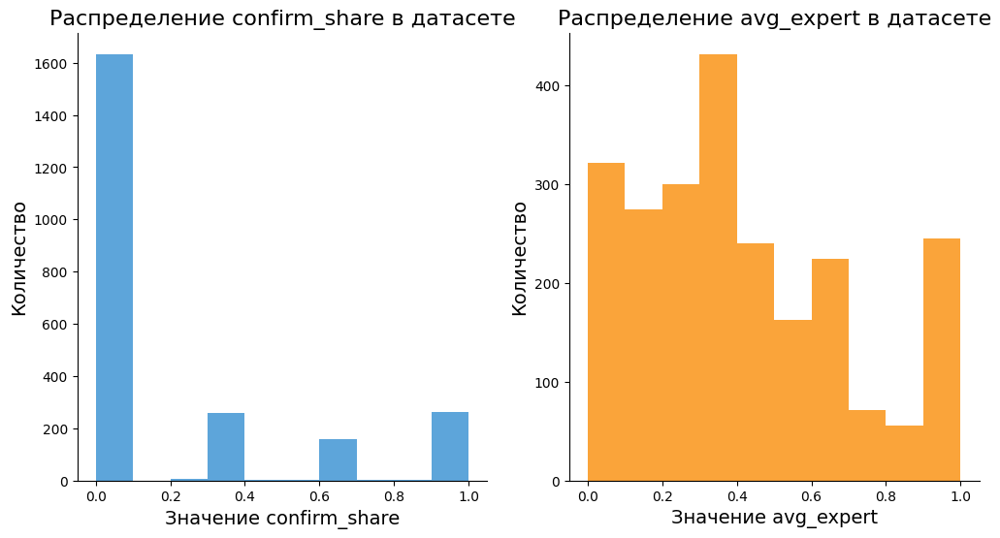

In [ ]:
df = df_crowd_expert[['confirm_share', 'avg_expert']]
bins = 10

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

ax[0].hist(df['confirm_share'], bins=bins, color='#5DA5DA')
ax[1].hist(df['avg_expert'], bins=bins, color='#FAA43A')

ax[0].set_title('Распределение confirm_share в датасете', fontsize=16)
ax[0].set_xlabel('Значение confirm_share', fontsize=14)
ax[0].set_ylabel('Количество', fontsize=14)

ax[1].set_title('Распределение avg_expert в датасете', fontsize=16)
ax[1].set_xlabel('Значение avg_expert', fontsize=14)
ax[1].set_ylabel('Количество', fontsize=14)

# Удаление рамок у графиков
for i in range(2):
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)

plt.show()


На данных гистограммах видно что данные не распределены равномерно, на таких данных невозможно получить предсказания, поэтому необходима дальнейшая обработка.

Выравним среднее распределений экспертых оценок:


In [ ]:
expert_weight = (df_crowd_expert['confirm_share'] * df_crowd_expert['n_voted']).mean() / df_crowd_expert['avg_expert'].mean()
print(expert_weight)
# Это значение далее поставим для n_voted для каждого эксперта

1.49609282500592


In [ ]:
# добавление среднего числа проголосовавших в экспертной оценке
expert_annots['n_voted'] = expert_weight

In [ ]:
expert_annots = expert_annots.rename(columns={'avg_expert' : 'confirm_share'})

In [ ]:
# конкатенация датасетов оценок по вертикали для получения тренировочной выборки
crowd_experts_conc = pd.concat([crowd_annots, expert_annots])

In [ ]:
display(crowd_experts_conc.head())

,file_name,query_id,n_voted,confirm_share
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,3.0,1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,3.0,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,3.0,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,3.0,0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,3.0,0.0


**Проверка на корректное расположение тренировочных и тестовых данных**

In [ ]:
train_dataset = []
test_dataset = []
train_images = set(os.listdir(os.path.join(DATA_PATH, 'train_images')))
test_images = set(os.listdir(os.path.join(DATA_PATH, 'test_images')))

for name in crowd_experts_conc['file_name']:
  if name in train_images:
    train_dataset.append(name)
  else:
    test_dataset.append(name)

Ниже проверим, что фото тренировочных и тестовых папок не пересекаются:

In [ ]:
print(len(train_images))
filenames = set(crowd_experts_conc['file_name'])
print(len(filenames.intersection(test_images)))

1024
0


In [ ]:
print(test_dataset)
print(len(test_dataset))

[]
0


Все фото находятся на своих местах

**Исследование текстовых данных**

Перед исследованием текста его необходимо лемматизировать и очистить от лишних символов:

In [ ]:
# Удаление лишних символов из текста для его исследования


# def text_without_symbols(row):

#     row = re.split(r'[`\-=~!@$%^&*()_+\[\]{};\'\\:"|<,./<>?«»]', row)
#     row = ''.join(row)
#     row = re.split(r'\s', row)
#     for word in row:
#         to_exept = '`\-=~!@$%^&*()_+\[\]{};\'\\:"|<,./<>?«»'
#         to_exept = re.split(r'', to_exept)
#         if word in to_exept:
#             row.remove(word)
#     row = ' '.join(row)
#     return row



In [ ]:
# train_df['query_text'] = train_df['query_text'].apply(text_without_symbols)
# display(train_df['query_text'].head())

In [ ]:
# test_dfq['query_text'] = test_dfq['query_text'].apply(text_without_symbols)
# display(test_dfq['query_text'].head())

In [ ]:
nlp = spacy.load("en_core_web_sm")
config = {"mode": "rule"}
print(nlp)

In [ ]:
nlp = spacy.load("en_core_web_sm")

In [ ]:
tqdm.pandas()

corpus = train_df['query_text']


def lemmatize(text):
    lemm_text = " ".join([token.lemma_ for token in nlp(text.lower())])
    return lemm_text


def clear_text(text):
    result = re.sub(r'[^A-Za-z]', ' ', text)
    result = result.split()
    result = ' '.join(result)
    return result


lemm_text = corpus.progress_apply(lambda x: lemmatize(clear_text(x)))

print("Исходный текст:", corpus[0])
print()
print("Очищенный и лемматизированный текст:", lemm_text[0])

  0%|          | 0/5822 [00:00<?, ?it/s]

Исходный текст: A young child is wearing blue goggles and sitting in a float in a pool .

Очищенный и лемматизированный текст: a young child be wear blue goggle and sit in a float in a pool


Текст тренировочной и тестовой выборок очищен от символов и лемматизирован



In [ ]:
train_df['lemm_text'] = pd.Series(lemm_text)

train_df.head()

,image,query_id,query_text,lemm_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,a young child be wear blue goggle and sit in a...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,a young child be wear blue goggle and sit in a...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,a young child be wear blue goggle and sit in a...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,a young child be wear blue goggle and sit in a...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,a young child be wear blue goggle and sit in a...


In [ ]:
tqdm.pandas()

corpus_test = test_dfq['query_text']

lemm_text_test = corpus_test.progress_apply(lambda x: lemmatize(clear_text(x)))

print("Исходный текст тестовой выборки:", corpus_test[0])
print()
print("Очищенный и лемматизированный текст тестовой выборки:", lemm_text_test[0])

  0%|          | 0/500 [00:00<?, ?it/s]

Исходный текст тестовой выборки: Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .

Очищенный и лемматизированный текст тестовой выборки: two blonde boy one in a camouflage shirt and the other in blue be have a water fight


Текст тестовых данных очищен и  лемматизирован

In [ ]:
test_dfq['lemm_text'] = pd.Series(lemm_text_test)

test_dfq.head()

,query_id,query_text,image,lemm_text
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg,two blonde boy one in a camouflage shirt and t...
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg,two boy be squirt water gun at each other
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg,two boy spray each other with water
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg,two child wear jean squirt water at each other
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg,two young boy be squirt water at each other


Тексты тренировочной и тестовой выборки лемматизированы

 Далее необходимо исследовать графики текстовых данных, изучить, есть ли странные слова и какие  вообще имеются закономерности.

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


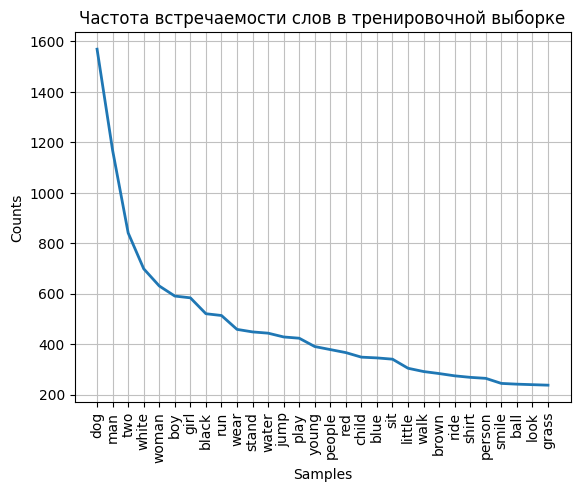

In [ ]:
nltk.download('stopwords')
nltk.download('punkt')
stop_words = set(stopwords.words('english'))
fdist = FreqDist([word for word in word_tokenize(' '.join(train_df['lemm_text'])) if word not in stop_words])
fig = plt.figure()
fdist.plot(30, title='Частота встречаемости слов в тренировочной выборке')
fig.show()

На графике видно, что наиболее употребляемое слово при описании фото - это "dog". Веротято, в датасете имеется много изображений собак. В пятерку наиболее употребляемых слов описаний также входят слова "man" - может означать человека или мужчин, "two" - часто объектов описаний 2, "white" - чаще всего объект белого цвета и "woman"  - женщины также встречаются ожидаемо часто

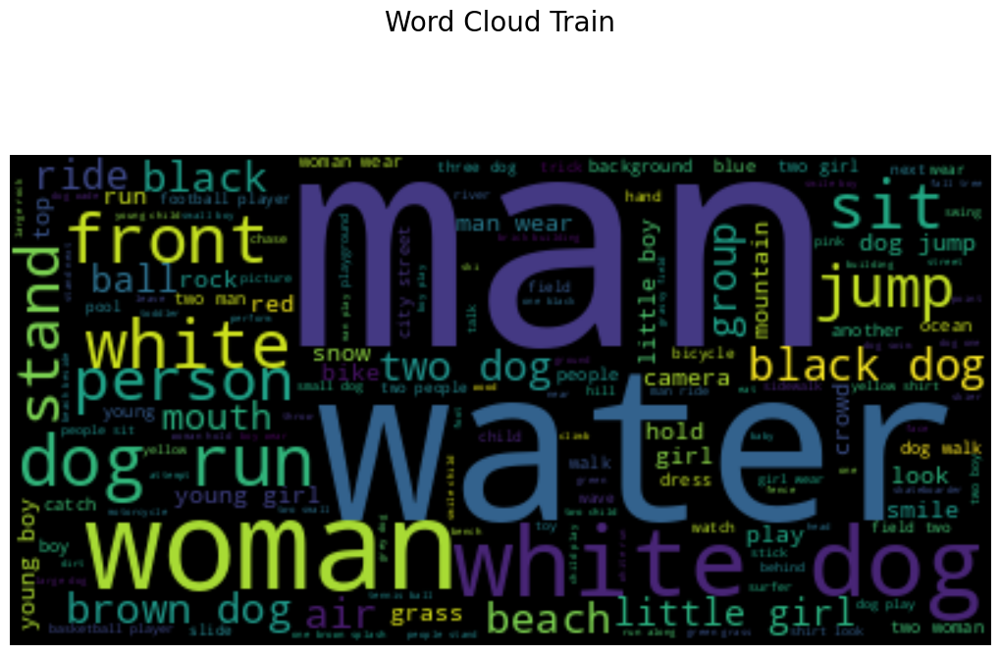

In [ ]:
%matplotlib inline
text_raw = ' '.join(train_df['lemm_text'])
word_cloud = WordCloud(stopwords=stop_words).generate(text_raw)
fig = plt.figure(figsize=(10,8),facecolor = 'white', edgecolor='blue')
plt.imshow(word_cloud, interpolation='bilinear')
fig.suptitle('Word Cloud Train', fontsize=20)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

У WordCloud несколько другой алгоритм  и результат немного другой чем изображено на графике выше, но в целом картина та же - наиболее употребляемые слова здесь в целом те же.

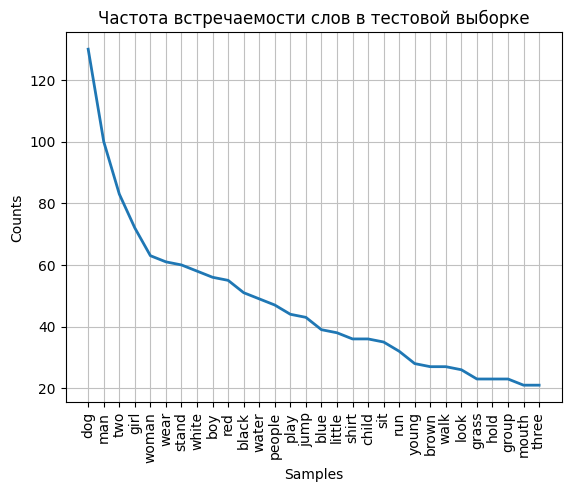

In [ ]:
fdist = FreqDist([word for word in word_tokenize(' '.join(test_dfq['lemm_text'])) if word not in stop_words])
fig = plt.figure()
fdist.plot(30, title='Частота встречаемости слов в тестовой выборке')
fig.show()

В тренировочном датасете почти аналогичная картина, только чаще определена девочка "girl" а белый цвет находится в десятке популярных описаний

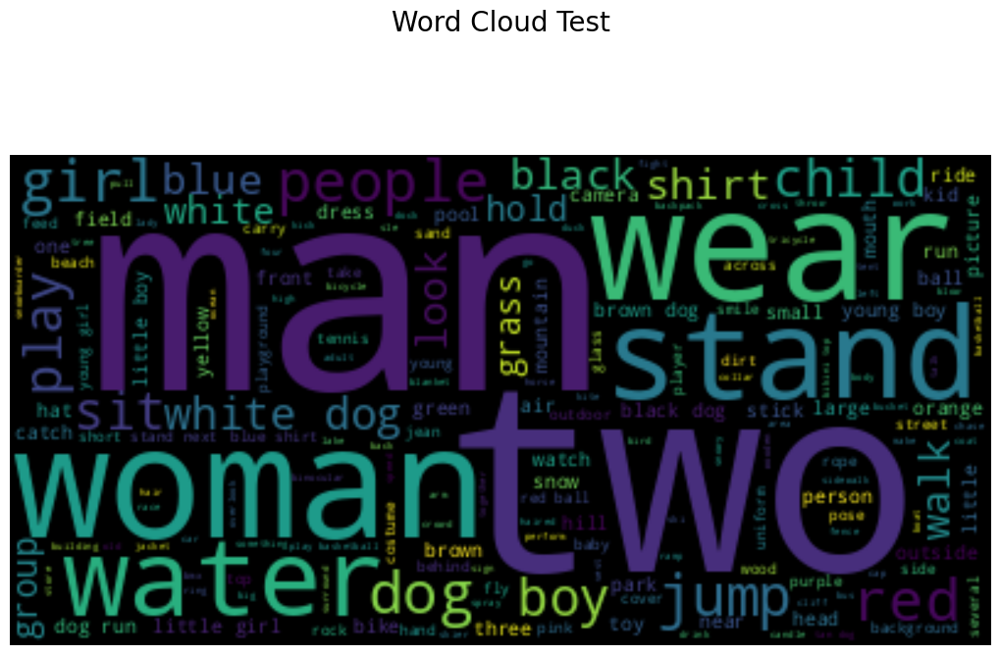

In [ ]:
text_raw = ' '.join(test_dfq['lemm_text'])
word_cloud = WordCloud(stopwords=stop_words).generate(text_raw)
fig = plt.figure(figsize=(10,8),facecolor = 'white', edgecolor='blue')
plt.imshow(word_cloud, interpolation='bilinear')
fig.suptitle('Word Cloud Test', fontsize=20)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

**Выводы:** Данные загружены и изучены. Визуально проблем таких как дубликаты и пропуски не обнаружено. Данные в целом содержат текстовую информацию, табличные данные и изображения. добавлены новые признаки усредненных оценок описаний.Текстовые данные лемматизированы и очищены от признаков, изучены наиболее часто встечающиеся слова, визуальных странностей в тексте не обнаружено.

## 2. Проверка данных

В некоторых странах, где мы работаем, существуют ограничения на обработку изображений. Поисковым сервисам и сервисам, которые предоставляют возможность поиска, запрещено предоставлять любую информацию, включая тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей без разрешения родителей или законных представителей. Любой человек, не достигший 16 лет, считается ребенком.

Мы строго следуем законам стран, в которых работаем, поэтому при попытке просмотра запрещенных законодательством изображений в нашем сервисе, вместо картинок показывается дисклеймер:

"This image is unavailable in your country in compliance with local laws".

Однако в нашем PoC отсутствует функционал для этого. Поэтому мы должны удалить все изображения, которые нарушают данный закон из обучающей выборки.

In [ ]:
exclude_set = {'teen', 'sprog', 'tot', 'adolescent', 'tiny tot', 'cherub', 'juvenile delinquent', 'offspring',
                'sprout', 'boy', 'little one', 'tadpole', 'girl', 'infant', 'bambino', 'teenager', 'kid',
                'rugrat', 'moppet', 'scion', 'pubescent', 'sapling', 'junior', 'young adult', 'high schooler',
                'newborn', 'tyke', 'cub', 'school', 'crawler', 'juvenile', 'nursling', 'toddler', 'wee one',
                'tween', 'seedling', 'minor', 'kindergarten', 'diaper-wearer', 'babe', 'little tyke', 'youngling',
                'youth', 'prepubescent', 'lass', 'underage', 'lad', 'youngster', 'child', 'baby', 'skateboarder',
                'student'}

# Внезапоно оказалось, что скейтбордисты в основном -- это дети(

In [ ]:
train_df.shape

(5822, 4)

In [ ]:
def find_kids_img(df):
  lst = []
  for index in range(df.shape[0]):
    sentence = df.iloc[index]['lemm_text']
    for word in sentence.split():
      if word in exclude_set:
        id = df.iloc[index]['query_id'].split('#')[0]
        lst.append(id)
  return lst

kids_lst_img_train = find_kids_img(train_df)
# kids_lst_img_test = find_kids_img(train_df)

In [ ]:
print(kids_lst_img_train)

['2549968784_39bfbe44f9.jpg', '2549968784_39bfbe44f9.jpg', '2549968784_39bfbe44f9.jpg', '2549968784_39bfbe44f9.jpg', '2549968784_39bfbe44f9.jpg', '2549968784_39bfbe44f9.jpg', '2549968784_39bfbe44f9.jpg', '2549968784_39bfbe44f9.jpg', '2549968784_39bfbe44f9.jpg', '2549968784_39bfbe44f9.jpg', '2549968784_39bfbe44f9.jpg', '2549968784_39bfbe44f9.jpg', '2718495608_d8533e3ac5.jpg', '2718495608_d8533e3ac5.jpg', '2718495608_d8533e3ac5.jpg', '2718495608_d8533e3ac5.jpg', '2718495608_d8533e3ac5.jpg', '2718495608_d8533e3ac5.jpg', '2718495608_d8533e3ac5.jpg', '2718495608_d8533e3ac5.jpg', '2718495608_d8533e3ac5.jpg', '2718495608_d8533e3ac5.jpg', '3545652636_0746537307.jpg', '3545652636_0746537307.jpg', '3545652636_0746537307.jpg', '3545652636_0746537307.jpg', '3545652636_0746537307.jpg', '3545652636_0746537307.jpg', '3545652636_0746537307.jpg', '3545652636_0746537307.jpg', '3545652636_0746537307.jpg', '3545652636_0746537307.jpg', '3545652636_0746537307.jpg', '3545652636_0746537307.jpg', '3545652636_0

Размер датасета с уникальными изображениями детей:

In [ ]:
len(set(kids_lst_img_train))

305

In [ ]:
len(set(kids_lst_img_train))
kids_uniq_img_trainset = list(set(kids_lst_img_train))

In [ ]:
uniq_train_imgs = list(set(os.listdir(os.path.join(DATA_PATH, 'train_images'))))
uniq_test_imgs = list(set(os.listdir(os.path.join(DATA_PATH, 'test_images'))))



def to_find_real_kids_img(kids_lst, img_lst):
  real_img_lst = []
  for kid_img in kids_lst:
    if kid_img in img_lst:
      real_img_lst.append(kid_img)
  return real_img_lst


kids_train_img = to_find_real_kids_img(kids_uniq_img_trainset, uniq_train_imgs)


print(kids_train_img)

['3025549604_38b86198f5.jpg', '1287475186_2dee85f1a5.jpg', '2458269558_277012780d.jpg', '2479652566_8f9fac8af5.jpg', '3433982387_3fa993cf5a.jpg', '3516825206_5750824874.jpg', '510531976_90bbee22a2.jpg', '583174725_6b522b621f.jpg', '154871781_ae77696b77.jpg', '3677318686_b018862bb7.jpg', '2061144717_5b3a1864f0.jpg', '2208067635_39a03834ca.jpg', '3482062809_3b694322c4.jpg', '3187395715_f2940c2b72.jpg', '3347666612_659e6e2207.jpg', '2194286203_5dc620006a.jpg', '2544426580_317b1f1f73.jpg', '1499581619_a5f65a882c.jpg', '3564312955_716e86c48b.jpg', '1415591512_a84644750c.jpg', '2306674172_dc07c7f847.jpg', '3421789737_f625dd17ed.jpg', '2358554995_54ed3baa83.jpg', '2991575785_bd4868e215.jpg', '3315616181_15dd137e27.jpg', '3361990489_92244a58ef.jpg', '3115174046_9e96b9ce47.jpg', '2160266952_a2ab39191b.jpg', '3217266166_4e0091860b.jpg', '2271755053_e1b1ec8442.jpg', '2396691909_6b8c2f7c44.jpg', '2549968784_39bfbe44f9.jpg', '2208310655_a3d83080c5.jpg', '3605061440_1d08c80a57.jpg', '2207244634_1db1

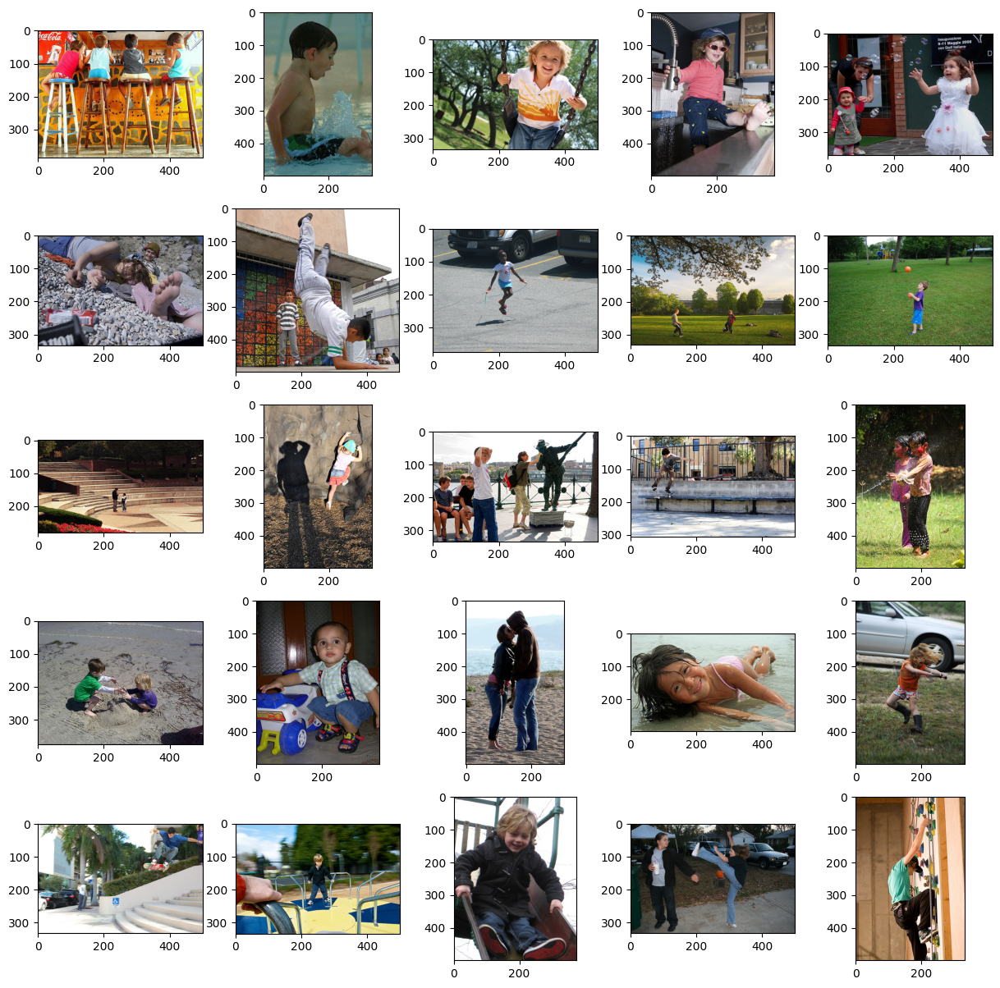

In [ ]:
plt.figure(figsize=(15, 15))

for i in range(25):
  img_name = kids_train_img[i]
  plt.subplot(5, 5, i+1)
  img = Image.open(os.path.join(DATA_PATH, "train_images", img_name))
  plt.imshow(img)

Эти картинки необходимо убрать

In [ ]:
descriptions = {}
for line in train_df.iterrows():
  line = line[1]
  query_text = line['query_text']
  img_id = line['query_id'].split('#')[0]
  if img_id not in descriptions:
    descriptions[img_id] = []
  descriptions[img_id].append(query_text)

Если у картинки нет описания, там тоже может быть ребенок, и эти картинки надо удалить

In [ ]:
train_df.iloc[0]['image']
train_df.shape

(5822, 4)

In [ ]:
def del_img_from_data(df, kids_df, has_description):
  imgi_to_del = []
  for i in range(len(df)):
    if df.iloc[i]['file_name'] in set(kids_df) or df.iloc[i]['file_name'] not in has_description:
      imgi_to_del.append(i)
  df = df.reset_index().drop(imgi_to_del, axis=0)
  return df

In [ ]:
print(crowd_experts_conc.index)

Int64Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,
            ...
            5812, 5813, 5814, 5815, 5816, 5817, 5818, 5819, 5820, 5821],
           dtype='int64', length=53652)


In [ ]:
train_df_no_kids = del_img_from_data(crowd_experts_conc, kids_train_img, descriptions)

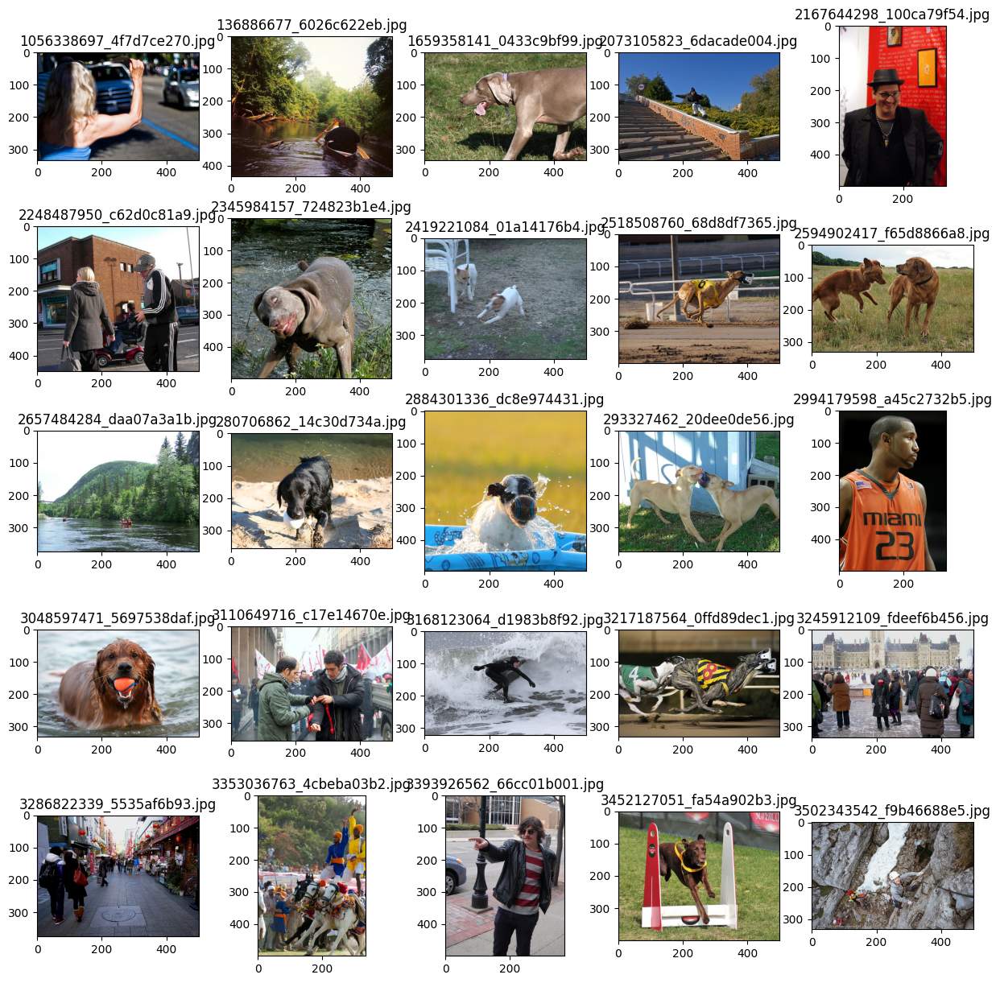

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(25):
  img_name = train_df_no_kids.iloc[i*1000]['file_name']
  plt.subplot(5, 5, i + 1)
  img = Image.open(os.path.join(DATA_PATH, "train_images", img_name))
  plt.imshow(img)
  plt.title(img_name)

In [ ]:
display(train_df_no_kids.head(3))

,index,file_name,query_id,n_voted,confirm_share
0,0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,3.0,1.0
1,1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,3.0,0.0
2,2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,3.0,0.0


Изображения детей исключены из тренировочного датасета.

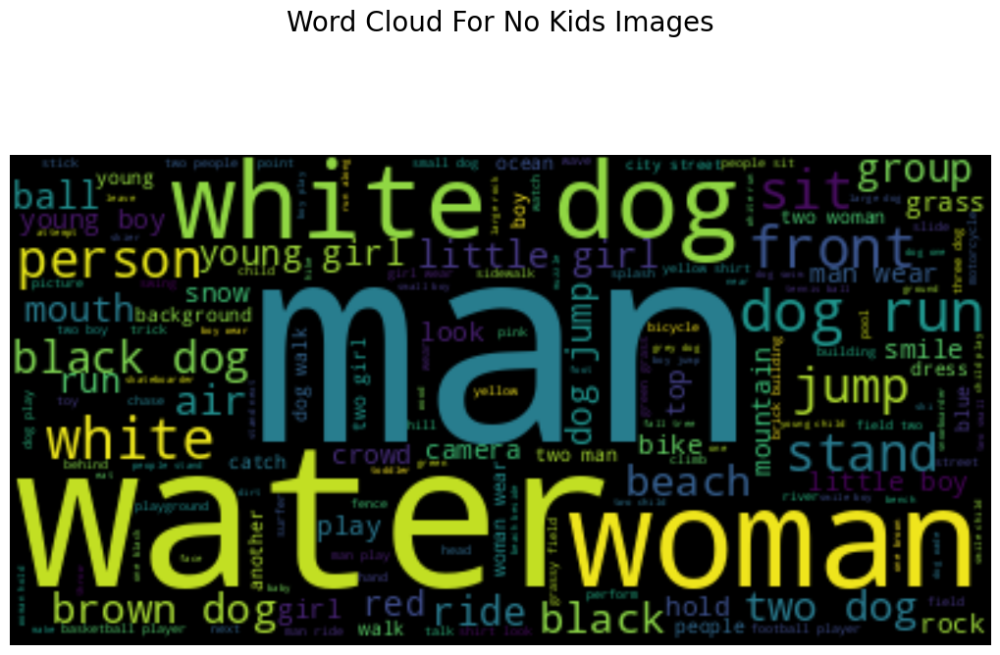

In [ ]:
text_raw = ' '.join(train_df['lemm_text'])
word_cloud = WordCloud(stopwords=stop_words).generate(text_raw)
fig = plt.figure(figsize=(10,8),facecolor = 'white', edgecolor='blue')
plt.imshow(word_cloud, interpolation='bilinear')
fig.suptitle('Word Cloud For No Kids Images', fontsize=20)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

**Вывод:** Хотя в описании по-прежнему присутствуют слова, относящиеся к детям, изображения с детьми исключены из тренировочного набора данных. Данные слова представляют собой описания других фото без детей

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 Отлично, удалены детские фото из датасета, причем сделано это самым "красивым" и оптимальным способом.


## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

Для каждого изображения можно получить несколько векторов, если к изображению применить аугментации. Тогда получатся разнообразные векторы, и можно использовать в обучении не один вектор, а несколько различных. Я этого делать не буду, просто сначала планировала. Поэтому для каждого изображения в файле
имеется не 1 вектор, а несколько различных.

In [ ]:
# # Вычисляем эмбеддинги картинок

# torch.random.manual_seed(42)
# device = 'cuda'
# model = resnet50(weights='IMAGENET1K_V2').to(device).eval()

# # REMOVING CLASSIFIER
# model.fc = torch.nn.Identity()

# train_images_df = pd.DataFrame({'image': train_df_no_kids['file_name'].unique()})
# test_images_df = pd.DataFrame({'image': test_dfi['image'].unique()})

# train_augs = T.Compose([
#     T.RandomResizedCrop((224, 224), scale=(0.5, 1.0)),
#     T.ToTensor(),
#     T.RandomHorizontalFlip(),
#     T.Normalize(mean=[0.5, 0.5, 0.5], std=[0.2, 0.2, 0.2]),
# ])

# test_augs = T.Compose([
#     T.Resize((224, 224)),
#     T.ToTensor(),
#     T.Normalize(mean=[0.5, 0.5, 0.5], std=[0.2, 0.2, 0.2]),
# ])

# train_embeddings = {}
# test_embeddings = {}

# # device = cuda

# with torch.no_grad():
#   for index in trange(len(train_images_df['image'])):
#     name = train_images_df['image'][index]
#     path = '/content/drive/MyDrive/Practicum_Datasets/train_images'
#     batch = []
#     for variant in range(32):
#       img = Image.open(path + '/' + name)
#       img = train_augs(img)
#       batch.append(img.unsqueeze(0))
#     emb = model.forward(torch.cat(batch, dim=0).to(device))

#     train_embeddings[name] = emb.to('cpu')

In [ ]:
# with torch.no_grad():
#   for index in trange(len(test_images_df['image'])):
#     name = test_images_df['image'][index]
#     path = '/content/drive/MyDrive/Practicum_Datasets/test_images'
#     img = Image.open(path + '/' + name)
#     img = test_augs(img)
#     emb = model.forward(img.unsqueeze(0).to(device))

#     test_embeddings[name] = emb.to('cpu')

In [ ]:
# torch.save(
#     {'train': train_embeddings, 'test': test_embeddings},
#     os.path.join(DATA_PATH, 'img_embeddings.pth'))

In [ ]:
## Загружаем вычисленные выше эмбеддинги картинок
data = torch.load(os.path.join(DATA_PATH, 'img_embeddings.pth'))
train_img_embeddings = data['train']
test_img_embeddings = data['test']

Посмотрим, являются ли векторы описательными. Для этого выберем несколько
фотографий и найдем фотографии, которые ближе всего к ним по косинусному
расстоянию. Мы должны видеть, что близкие фотографии по косинусному расстоянию
похожи друг на друга.

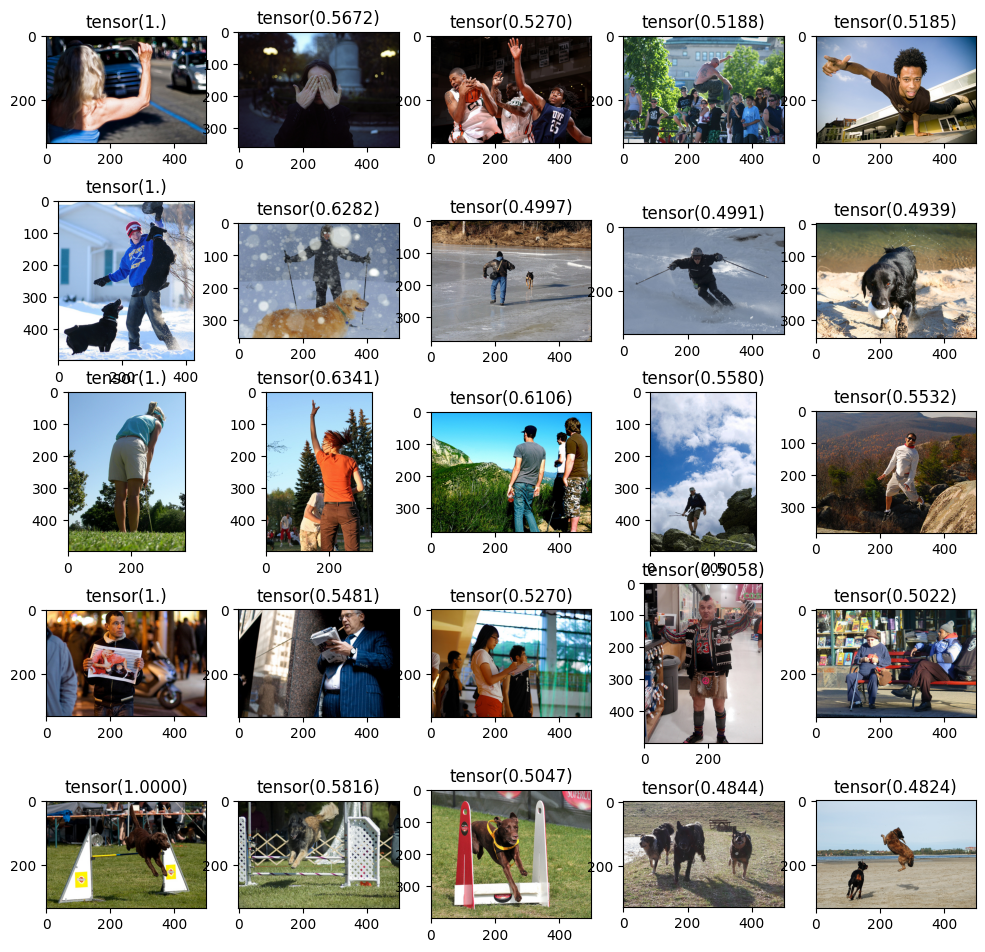

In [ ]:
norm_vect = []
img_names = []
for k, v in train_img_embeddings.items():
  norm_vect.append(v[0, :].unsqueeze(0))
  img_names.append(k)

norm_vect = torch.cat(norm_vect, dim=0)

# norm_vect = train_img_embeddings[1]
# print(norm_vect.shape)
norm_vect = torch.nn.functional.normalize(norm_vect, p=2, dim=1)
# print(norm_vect.shape)

plt.figure(figsize=(12, 12))
for index in range(5):
  cos = norm_vect[index * 100, :] @ norm_vect.T
  # print(cos.shape)
  # print("Here")
  # break
  order = cos.argsort(descending=True)

  five_closest = order[:5]
  for index2 in range(len(five_closest)):
    cos_val = cos[five_closest[index2]]
    img_name = img_names[five_closest[index2]]
    # print('Here')
    plt.subplot(5, 5, 5 * index + index2 + 1)
    plt.imshow(
        np.array(
            Image.open(os.path.join(DATA_PATH, 'train_images', img_name))))
    plt.title(str(cos_val))

Левый столбец изображений -- исходные изображения, в строке перечислены ближайшие к исходному изображению картинки из обучающего датасета. Также
указано косинусное расстояние. По этой иллюстрации понятно, что векторы отражают смысл изображения.

Векторизация изображений тренировочных и тестовых данных с помощью ResNet50, натренированной предварительно на ImageNet, произведена.

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


Берт умеет из сочетания последовательности слов извлекать семантический смысл, поэтому будем использовать его. TF-IDF здесь не очень хорошо подходит, так как выборка слов не очень большая и будет работать хуже.

In [ ]:
unique_txtid = train_df.groupby(['query_id', 'query_text']).nunique().reset_index()[['query_id', 'query_text']]
unique_txtid.head()

,query_id,query_text
0,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f..."
1,106490881_5a2dd9b7bd.jpg#2,A young boy in swimming trunks is walking with...
2,1082379191_ec1e53f996.jpg#2,A man and a woman sitting on a dock .
3,1084040636_97d9633581.jpg#2,A white dog has its head on the ground .
4,1096395242_fc69f0ae5a.jpg#2,A young boy with his foot outstretched aims a ...


In [ ]:
test_df = test_dfq
unique_txtid_test = test_df.groupby(['query_id', 'query_text']).nunique().reset_index()[['query_id', 'query_text']]
unique_txtid_test.head()

,query_id,query_text
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an..."
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...


In [ ]:
## Вычисляем эмбеддинги текстов

# bert_version = 'bert-base-uncased'
# model = torch.hub.load('huggingface/pytorch-transformers', 'model', bert_version)    # Download model and configuration from S3 and cache.
# tokenizer = torch.hub.load('huggingface/pytorch-transformers', 'tokenizer', bert_version)    # Download vocabulary from S3 and cache.

# tokenizer = BertTokenizer.from_pretrained(bert_version)
# model = BertModel.from_pretrained(bert_version)

# model = model.eval()

# def get_text_embeddings(data):
#   embeddings = {}
#   for index in trange(len(data)):
#     text = [data.iloc[index]['query_text'].lower()]
#     query_id = data.iloc[index]['query_id']

#     encodings = tokenizer(
#         text, # the texts to be tokenized
#         return_tensors='pt' # return the tensors (not lists)
#     )

#     with torch.no_grad():
#       emb = model(**encodings).last_hidden_state[:, 0, :] # extracting classification token
#       # emb = torch.nn.functional.normalize(emb, p=2, dim=1)
#       embeddings[query_id] = emb

#   return embeddings

# train_text_embeddings = get_text_embeddings(unique_txtid)
# test_text_embeddings = get_text_embeddings(unique_txtid_test)

In [ ]:
# torch.save(
#     {'train': train_text_embeddings,
#      'test': test_text_embeddings},
#     '/content/drive/MyDrive/Practicum_Datasets/text_embeddings.pth')

In [ ]:
## Загружаем эмбеддинги текстов
data = torch.load(os.path.join(DATA_PATH, 'text_embeddings.pth'))
train_text_embeddings = data['train']
test_text_embeddings = data['test']


In [ ]:
matrix_text_ids = []
matrix_text_embeddings = []
for k, v in train_text_embeddings.items():
  matrix_text_ids.append(k)
  matrix_text_embeddings.append(v)

matrix_text_ids = np.array(matrix_text_ids)
matrix_text_embeddings = torch.vstack(matrix_text_embeddings)
matrix_text_embeddings = torch.nn.functional.normalize(matrix_text_embeddings, p=2, dim=1)
matrix_text_embeddings = np.array(matrix_text_embeddings)

# print((matrix_text_embeddings**2).sum(axis=1))

print(matrix_text_ids.shape)
print(matrix_text_embeddings.shape)

print(matrix_text_embeddings)

text_by_id = {}
for row in unique_txtid.iterrows():
  k = row[1]['query_id']
  v = row[1]['query_text']
  text_by_id[k] = v

for index in range(1, 1000, 100):
  dots = matrix_text_embeddings[index, :] @ matrix_text_embeddings.T
  order = dots.argsort()[::-1]
  four_closest = order[:5]

  current_text_id = matrix_text_ids[index]
  closest_text_ids = matrix_text_ids[four_closest]
  # print(current_text_id, closest_text_ids)
  print()
  print('CURRENT:', text_by_id[current_text_id])
  for index2 in range(len(closest_text_ids)):
    cos = dots[four_closest[index2]]
    id = closest_text_ids[index2]
    print('SIMILAR:', cos, text_by_id[id])

(977,)
(977, 768)
[[ 0.00040908  0.0151685   0.0166064  ... -0.01179158  0.00018093
   0.00683915]
 [ 0.01862319  0.00260028 -0.00347836 ... -0.01430436  0.01466375
   0.02597134]
 [ 0.00061516  0.01397311 -0.05525682 ... -0.012826    0.00012087
  -0.017313  ]
 ...
 [ 0.00167311  0.0046406  -0.04796074 ... -0.01595105  0.0143435
  -0.01430273]
 [ 0.00092203  0.01180808  0.0067591  ... -0.00670494  0.02023479
  -0.00342012]
 [-0.02566211 -0.00041703 -0.04435253 ... -0.01527257  0.0025029
   0.00357199]]

CURRENT: A young boy in swimming trunks is walking with his arms outstretched on the beach .
SIMILAR: 0.9999999 A young boy in swimming trunks is walking with his arms outstretched on the beach .
SIMILAR: 0.9714509 A man in black shorts is diving into a rocky pool .
SIMILAR: 0.9714004 A boy is on the beach with a paddle in his hand as he walks through the ocean water .
SIMILAR: 0.96782523 A man is diving into water near a shore .
SIMILAR: 0.9664674 A young boy in a swimming suit sits in

Видим, что при помощи векторов, извлеченных таким образом, можно находить похожие предложения

## 5. Объединение векторов

Подготоим данные для обучения: объединим векторы изображений и векторы текстов с целевой переменной.

In [ ]:
display(train_df_no_kids.head())

,index,file_name,query_id,n_voted,confirm_share
0,0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,3.0,1.0
1,1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,3.0,0.0
2,2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,3.0,0.0
3,3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,3.0,0.0
4,4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,3.0,0.0


In [ ]:
X_train = []
y_train = []
w_train = []

X_test = []
y_test = []
w_test = []

# train_df_no_kids = train_df_no_kids.sort_values(by='file_name').reset_index()
train_imgs = list(set(train_df_no_kids['file_name']))
train_imgs = set(train_imgs[:int(0.7 * len(train_imgs))])


for row in train_df_no_kids.iterrows():
  row_index = row[0]

  img_name = row[1]['file_name']
  desc_name = row[1]['query_id']
  weight = row[1]['n_voted']
  p = row[1]['confirm_share']

  if img_name not in train_img_embeddings:
    continue
  if desc_name not in train_text_embeddings:
    continue

  img_vec = train_img_embeddings[img_name][:, :].mean(dim=0)
  desc_vec = train_text_embeddings[desc_name][0, :]

  vec = torch.cat([img_vec, desc_vec], axis=0)

  if img_name in train_imgs:
    X_train.append(vec)
    y_train.append(p)
    w_train.append(weight)
  else:
    X_test.append(vec)
    y_test.append(p)
    w_test.append(weight)
  # print(img_vec.shape)
  # print(desc_vec.shape)
  # break
  # vectors.append()

X_train = np.array(torch.vstack(X_train))
y_train = np.array(torch.tensor(y_train))
w_train = np.array(torch.tensor(w_train))

X_test = np.array(torch.vstack(X_test))
y_test = np.array(torch.tensor(y_test))
w_test = np.array(torch.tensor(w_test))

In [ ]:
print(X_train.shape, X_test.shape)

(25055, 2816) (10646, 2816)


## 6. Обучение модели предсказания соответствия

Для обучения нашей модели мы должны разделить датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит, так как мы должны исключить попадание изображения и в обучающую, и в тестовую выборки. Для этого мы можем воспользоваться классом GroupShuffleSplit из библиотеки sklearn.model_selection.
Ниже приведен код, который разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, чтобы строки с одинаковым значением 'group_column' содержались либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Мы можем использовать любую модель для решения задачи определения соответствия изображения тексту. Необходимо также выбрать метрику качества, которую будем использовать для оценки работы модели. Мы можем использовать уже существующие метрики или реализовать свою собственную. Целевая переменная должна быть числом от 0 до 1, чтобы наша модель могла возвращать вероятность соответствия изображения тексту. Если в датасете есть изображения, нарушающие законы стран, в которых мы работаем, мы должны удалить их из обучающей выборки.

## Логистическая регрессия tf (потому что лейбл от 0 до 1)

**Обоснование выбора метрики качества:** Выбрана метрика MAE, как интерпретируемую метрику для регрессии. Здесь нельзя применять метрики для классификации, MAE - самая понятная - на сколько в среднем ошибается модель.

In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train, w_train))
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test, w_test))

BATCH_SIZE = 64
SHUFFLE_BUFFER_SIZE = 100

train_dataset = train_dataset.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_dataset = test_dataset.batch(BATCH_SIZE)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1.0e-3),
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics='mae')
model.fit(train_dataset, validation_data=test_dataset, epochs=100)

Epoch 1/100
374/392 [===========================>..] - ETA: 0s - loss: 0.8607 - mae: 0.1430


392/392 [==============================] - 3s 4ms/step - loss: 0.8587 - mae: 0.1461 - val_loss: 1.0804 - val_mae: 0.2412
Epoch 2/100
391/392 [============================>.] - ETA: 0s - loss: 0.7958 - mae: 0.1370


392/392 [==============================] - 1s 4ms/step - loss: 0.7956 - mae: 0.1371 - val_loss: 1.0979 - val_mae: 0.2451
Epoch 3/100
381/392 [============================>.] - ETA: 0s - loss: 0.7796 - mae: 0.1325


392/392 [==============================] - 1s 4ms/step - loss: 0.7795 - mae: 0.1344 - val_loss: 1.0724 - val_mae: 0.2376
Epoch 4/100
379/392 [============================>.] - ETA: 0s - loss: 0.7697 - mae: 0.1302


392/392 [==============================] - 1s 3ms/step - loss: 0.7697 - mae: 0.1324 - val_loss: 1.0700 - val_mae: 0.2357
Epoch 5/100
387/392 [============================>.] - ETA: 0s - loss: 0.7644 - mae: 0.1305


392/392 [==============================] - 2s 5ms/step - loss: 0.7641 - mae: 0.1312 - val_loss: 1.0384 - val_mae: 0.2267
Epoch 6/100
386/392 [============================>.] - ETA: 0s - loss: 0.7591 - mae: 0.1293


392/392 [==============================] - 2s 6ms/step - loss: 0.7591 - mae: 0.1302 - val_loss: 1.0284 - val_mae: 0.2239
Epoch 7/100
388/392 [============================>.] - ETA: 0s - loss: 0.7557 - mae: 0.1291


392/392 [==============================] - 2s 4ms/step - loss: 0.7555 - mae: 0.1297 - val_loss: 1.0466 - val_mae: 0.2277
Epoch 8/100
379/392 [============================>.] - ETA: 0s - loss: 0.7521 - mae: 0.1268


392/392 [==============================] - 2s 4ms/step - loss: 0.7523 - mae: 0.1290 - val_loss: 1.0710 - val_mae: 0.2335
Epoch 9/100
374/392 [===========================>..] - ETA: 0s - loss: 0.7491 - mae: 0.1253


392/392 [==============================] - 1s 4ms/step - loss: 0.7504 - mae: 0.1287 - val_loss: 1.0502 - val_mae: 0.2277
Epoch 10/100
375/392 [===========================>..] - ETA: 0s - loss: 0.7478 - mae: 0.1251


392/392 [==============================] - 1s 4ms/step - loss: 0.7488 - mae: 0.1281 - val_loss: 1.1104 - val_mae: 0.2418
Epoch 11/100
389/392 [============================>.] - ETA: 0s - loss: 0.7476 - mae: 0.1274


392/392 [==============================] - 1s 3ms/step - loss: 0.7473 - mae: 0.1278 - val_loss: 1.1006 - val_mae: 0.2392
Epoch 12/100
382/392 [============================>.] - ETA: 0s - loss: 0.7451 - mae: 0.1258


392/392 [==============================] - 2s 6ms/step - loss: 0.7453 - mae: 0.1274 - val_loss: 1.1406 - val_mae: 0.2483
Epoch 13/100
391/392 [============================>.] - ETA: 0s - loss: 0.7451 - mae: 0.1272


392/392 [==============================] - 2s 6ms/step - loss: 0.7451 - mae: 0.1273 - val_loss: 1.1051 - val_mae: 0.2391
Epoch 14/100
377/392 [===========================>..] - ETA: 0s - loss: 0.7437 - mae: 0.1245


392/392 [==============================] - 1s 4ms/step - loss: 0.7445 - mae: 0.1271 - val_loss: 1.1000 - val_mae: 0.2369
Epoch 15/100
392/392 [==============================] - ETA: 0s - loss: 0.7446 - mae: 0.1270


392/392 [==============================] - 1s 3ms/step - loss: 0.7446 - mae: 0.1270 - val_loss: 1.1785 - val_mae: 0.2555
Epoch 16/100
381/392 [============================>.] - ETA: 0s - loss: 0.7433 - mae: 0.1251


392/392 [==============================] - 1s 4ms/step - loss: 0.7438 - mae: 0.1269 - val_loss: 1.1533 - val_mae: 0.2484
Epoch 17/100
379/392 [============================>.] - ETA: 0s - loss: 0.7425 - mae: 0.1244


392/392 [==============================] - 1s 4ms/step - loss: 0.7427 - mae: 0.1263 - val_loss: 1.1228 - val_mae: 0.2416
Epoch 18/100
387/392 [============================>.] - ETA: 0s - loss: 0.7417 - mae: 0.1255


392/392 [==============================] - 2s 6ms/step - loss: 0.7417 - mae: 0.1262 - val_loss: 1.1360 - val_mae: 0.2451
Epoch 19/100
389/392 [============================>.] - ETA: 0s - loss: 0.7406 - mae: 0.1256


392/392 [==============================] - 2s 6ms/step - loss: 0.7407 - mae: 0.1260 - val_loss: 1.1033 - val_mae: 0.2365
Epoch 20/100
383/392 [============================>.] - ETA: 0s - loss: 0.7404 - mae: 0.1246


392/392 [==============================] - 2s 5ms/step - loss: 0.7407 - mae: 0.1259 - val_loss: 1.1777 - val_mae: 0.2536
Epoch 21/100
384/392 [============================>.] - ETA: 0s - loss: 0.7404 - mae: 0.1248


392/392 [==============================] - 1s 3ms/step - loss: 0.7402 - mae: 0.1257 - val_loss: 1.1642 - val_mae: 0.2500
Epoch 22/100
388/392 [============================>.] - ETA: 0s - loss: 0.7387 - mae: 0.1249


392/392 [==============================] - 1s 3ms/step - loss: 0.7386 - mae: 0.1254 - val_loss: 1.1533 - val_mae: 0.2465
Epoch 23/100
386/392 [============================>.] - ETA: 0s - loss: 0.7395 - mae: 0.1247


392/392 [==============================] - 1s 3ms/step - loss: 0.7396 - mae: 0.1256 - val_loss: 1.1609 - val_mae: 0.2475
Epoch 24/100
391/392 [============================>.] - ETA: 0s - loss: 0.7400 - mae: 0.1254


392/392 [==============================] - 1s 4ms/step - loss: 0.7399 - mae: 0.1254 - val_loss: 1.1213 - val_mae: 0.2382
Epoch 25/100
383/392 [============================>.] - ETA: 0s - loss: 0.7396 - mae: 0.1245


392/392 [==============================] - 1s 3ms/step - loss: 0.7397 - mae: 0.1257 - val_loss: 1.1174 - val_mae: 0.2372
Epoch 26/100
378/392 [===========================>..] - ETA: 0s - loss: 0.7379 - mae: 0.1232


392/392 [==============================] - 2s 5ms/step - loss: 0.7386 - mae: 0.1256 - val_loss: 1.1402 - val_mae: 0.2427
Epoch 27/100
381/392 [============================>.] - ETA: 0s - loss: 0.7383 - mae: 0.1240


392/392 [==============================] - 2s 6ms/step - loss: 0.7386 - mae: 0.1256 - val_loss: 1.1175 - val_mae: 0.2366
Epoch 28/100
391/392 [============================>.] - ETA: 0s - loss: 0.7385 - mae: 0.1252


392/392 [==============================] - 2s 6ms/step - loss: 0.7384 - mae: 0.1253 - val_loss: 1.1017 - val_mae: 0.2333
Epoch 29/100
382/392 [============================>.] - ETA: 0s - loss: 0.7394 - mae: 0.1242


392/392 [==============================] - 1s 3ms/step - loss: 0.7397 - mae: 0.1258 - val_loss: 1.0585 - val_mae: 0.2224
Epoch 30/100
371/392 [===========================>..] - ETA: 0s - loss: 0.7364 - mae: 0.1216


392/392 [==============================] - 1s 4ms/step - loss: 0.7382 - mae: 0.1254 - val_loss: 1.0444 - val_mae: 0.2182
Epoch 31/100
385/392 [============================>.] - ETA: 0s - loss: 0.7362 - mae: 0.1243


392/392 [==============================] - 1s 3ms/step - loss: 0.7365 - mae: 0.1253 - val_loss: 1.0906 - val_mae: 0.2305
Epoch 32/100
382/392 [============================>.] - ETA: 0s - loss: 0.7354 - mae: 0.1237


392/392 [==============================] - 1s 3ms/step - loss: 0.7360 - mae: 0.1253 - val_loss: 1.0725 - val_mae: 0.2257
Epoch 33/100
380/392 [============================>.] - ETA: 0s - loss: 0.7344 - mae: 0.1231


392/392 [==============================] - 1s 3ms/step - loss: 0.7349 - mae: 0.1250 - val_loss: 1.0888 - val_mae: 0.2301
Epoch 34/100
375/392 [===========================>..] - ETA: 0s - loss: 0.7340 - mae: 0.1223


392/392 [==============================] - 1s 4ms/step - loss: 0.7355 - mae: 0.1252 - val_loss: 1.1076 - val_mae: 0.2342
Epoch 35/100
383/392 [============================>.] - ETA: 0s - loss: 0.7342 - mae: 0.1237


392/392 [==============================] - 1s 4ms/step - loss: 0.7346 - mae: 0.1250 - val_loss: 1.0803 - val_mae: 0.2272
Epoch 36/100
388/392 [============================>.] - ETA: 0s - loss: 0.7340 - mae: 0.1244


392/392 [==============================] - 3s 8ms/step - loss: 0.7340 - mae: 0.1249 - val_loss: 1.0631 - val_mae: 0.2230
Epoch 37/100
391/392 [============================>.] - ETA: 0s - loss: 0.7342 - mae: 0.1248


392/392 [==============================] - 1s 3ms/step - loss: 0.7341 - mae: 0.1248 - val_loss: 1.0863 - val_mae: 0.2287
Epoch 38/100
379/392 [============================>.] - ETA: 0s - loss: 0.7339 - mae: 0.1226


392/392 [==============================] - 1s 3ms/step - loss: 0.7349 - mae: 0.1247 - val_loss: 1.0632 - val_mae: 0.2227
Epoch 39/100
380/392 [============================>.] - ETA: 0s - loss: 0.7324 - mae: 0.1228


392/392 [==============================] - 1s 3ms/step - loss: 0.7334 - mae: 0.1247 - val_loss: 1.0799 - val_mae: 0.2266
Epoch 40/100
376/392 [===========================>..] - ETA: 0s - loss: 0.7316 - mae: 0.1218


392/392 [==============================] - 1s 4ms/step - loss: 0.7334 - mae: 0.1245 - val_loss: 1.0414 - val_mae: 0.2173
Epoch 41/100
377/392 [===========================>..] - ETA: 0s - loss: 0.7319 - mae: 0.1219


392/392 [==============================] - 1s 3ms/step - loss: 0.7332 - mae: 0.1244 - val_loss: 1.0371 - val_mae: 0.2156
Epoch 42/100
390/392 [============================>.] - ETA: 0s - loss: 0.7336 - mae: 0.1242


392/392 [==============================] - 2s 5ms/step - loss: 0.7335 - mae: 0.1244 - val_loss: 1.0121 - val_mae: 0.2087
Epoch 43/100
386/392 [============================>.] - ETA: 0s - loss: 0.7334 - mae: 0.1234


392/392 [==============================] - 2s 6ms/step - loss: 0.7338 - mae: 0.1242 - val_loss: 0.9708 - val_mae: 0.1965
Epoch 44/100
382/392 [============================>.] - ETA: 0s - loss: 0.7333 - mae: 0.1231


392/392 [==============================] - 3s 7ms/step - loss: 0.7337 - mae: 0.1245 - val_loss: 0.9842 - val_mae: 0.2008
Epoch 45/100
389/392 [============================>.] - ETA: 0s - loss: 0.7342 - mae: 0.1240


392/392 [==============================] - 1s 4ms/step - loss: 0.7339 - mae: 0.1243 - val_loss: 0.9973 - val_mae: 0.2049
Epoch 46/100
373/392 [===========================>..] - ETA: 0s - loss: 0.7317 - mae: 0.1209


392/392 [==============================] - 1s 3ms/step - loss: 0.7337 - mae: 0.1244 - val_loss: 0.9972 - val_mae: 0.2051
Epoch 47/100
382/392 [============================>.] - ETA: 0s - loss: 0.7330 - mae: 0.1226


392/392 [==============================] - 1s 3ms/step - loss: 0.7335 - mae: 0.1243 - val_loss: 1.0155 - val_mae: 0.2101
Epoch 48/100
386/392 [============================>.] - ETA: 0s - loss: 0.7322 - mae: 0.1232


392/392 [==============================] - 2s 5ms/step - loss: 0.7325 - mae: 0.1241 - val_loss: 1.0270 - val_mae: 0.2128
Epoch 49/100
385/392 [============================>.] - ETA: 0s - loss: 0.7340 - mae: 0.1235


392/392 [==============================] - 2s 6ms/step - loss: 0.7340 - mae: 0.1244 - val_loss: 1.0334 - val_mae: 0.2152
Epoch 50/100
390/392 [============================>.] - ETA: 0s - loss: 0.7324 - mae: 0.1239


392/392 [==============================] - 2s 5ms/step - loss: 0.7326 - mae: 0.1242 - val_loss: 1.0562 - val_mae: 0.2206
Epoch 51/100
390/392 [============================>.] - ETA: 0s - loss: 0.7325 - mae: 0.1239


392/392 [==============================] - 1s 3ms/step - loss: 0.7322 - mae: 0.1240 - val_loss: 1.0359 - val_mae: 0.2152
Epoch 52/100
384/392 [============================>.] - ETA: 0s - loss: 0.7318 - mae: 0.1229


392/392 [==============================] - 1s 3ms/step - loss: 0.7321 - mae: 0.1240 - val_loss: 1.0805 - val_mae: 0.2274
Epoch 53/100
385/392 [============================>.] - ETA: 0s - loss: 0.7304 - mae: 0.1225


392/392 [==============================] - 1s 3ms/step - loss: 0.7308 - mae: 0.1235 - val_loss: 1.0458 - val_mae: 0.2187
Epoch 54/100
387/392 [============================>.] - ETA: 0s - loss: 0.7304 - mae: 0.1228


392/392 [==============================] - 1s 3ms/step - loss: 0.7303 - mae: 0.1235 - val_loss: 1.0384 - val_mae: 0.2164
Epoch 55/100
381/392 [============================>.] - ETA: 0s - loss: 0.7297 - mae: 0.1218


392/392 [==============================] - 1s 4ms/step - loss: 0.7303 - mae: 0.1236 - val_loss: 1.0868 - val_mae: 0.2288
Epoch 56/100
386/392 [============================>.] - ETA: 0s - loss: 0.7307 - mae: 0.1228


392/392 [==============================] - 2s 5ms/step - loss: 0.7310 - mae: 0.1237 - val_loss: 1.0828 - val_mae: 0.2276
Epoch 57/100
390/392 [============================>.] - ETA: 0s - loss: 0.7297 - mae: 0.1232


392/392 [==============================] - 2s 6ms/step - loss: 0.7296 - mae: 0.1234 - val_loss: 1.1158 - val_mae: 0.2355
Epoch 58/100
390/392 [============================>.] - ETA: 0s - loss: 0.7296 - mae: 0.1231


392/392 [==============================] - 2s 6ms/step - loss: 0.7298 - mae: 0.1234 - val_loss: 1.1147 - val_mae: 0.2349
Epoch 59/100
373/392 [===========================>..] - ETA: 0s - loss: 0.7295 - mae: 0.1205


392/392 [==============================] - 1s 4ms/step - loss: 0.7310 - mae: 0.1237 - val_loss: 1.1328 - val_mae: 0.2385
Epoch 60/100
392/392 [==============================] - ETA: 0s - loss: 0.7306 - mae: 0.1234


392/392 [==============================] - 1s 4ms/step - loss: 0.7306 - mae: 0.1234 - val_loss: 1.0829 - val_mae: 0.2258
Epoch 61/100
380/392 [============================>.] - ETA: 0s - loss: 0.7310 - mae: 0.1220


392/392 [==============================] - 1s 4ms/step - loss: 0.7315 - mae: 0.1238 - val_loss: 1.0824 - val_mae: 0.2258
Epoch 62/100
392/392 [==============================] - ETA: 0s - loss: 0.7337 - mae: 0.1240


392/392 [==============================] - 1s 4ms/step - loss: 0.7337 - mae: 0.1240 - val_loss: 1.0769 - val_mae: 0.2244
Epoch 63/100
387/392 [============================>.] - ETA: 0s - loss: 0.7353 - mae: 0.1237


392/392 [==============================] - 2s 5ms/step - loss: 0.7353 - mae: 0.1243 - val_loss: 1.0205 - val_mae: 0.2102
Epoch 64/100
389/392 [============================>.] - ETA: 0s - loss: 0.7334 - mae: 0.1235


392/392 [==============================] - 2s 5ms/step - loss: 0.7332 - mae: 0.1239 - val_loss: 1.0959 - val_mae: 0.2291
Epoch 65/100
389/392 [============================>.] - ETA: 0s - loss: 0.7328 - mae: 0.1235


392/392 [==============================] - 2s 6ms/step - loss: 0.7324 - mae: 0.1238 - val_loss: 1.0739 - val_mae: 0.2229
Epoch 66/100
389/392 [============================>.] - ETA: 0s - loss: 0.7299 - mae: 0.1230


392/392 [==============================] - 1s 4ms/step - loss: 0.7299 - mae: 0.1233 - val_loss: 1.1124 - val_mae: 0.2334
Epoch 67/100
390/392 [============================>.] - ETA: 0s - loss: 0.7296 - mae: 0.1236


392/392 [==============================] - 1s 4ms/step - loss: 0.7293 - mae: 0.1237 - val_loss: 1.1120 - val_mae: 0.2324
Epoch 68/100
383/392 [============================>.] - ETA: 0s - loss: 0.7277 - mae: 0.1220


392/392 [==============================] - 1s 4ms/step - loss: 0.7286 - mae: 0.1233 - val_loss: 1.1177 - val_mae: 0.2337
Epoch 69/100
386/392 [============================>.] - ETA: 0s - loss: 0.7279 - mae: 0.1226


392/392 [==============================] - 1s 3ms/step - loss: 0.7284 - mae: 0.1233 - val_loss: 1.0650 - val_mae: 0.2207
Epoch 70/100
380/392 [============================>.] - ETA: 0s - loss: 0.7275 - mae: 0.1215


392/392 [==============================] - 2s 6ms/step - loss: 0.7284 - mae: 0.1233 - val_loss: 1.0466 - val_mae: 0.2156
Epoch 71/100
383/392 [============================>.] - ETA: 0s - loss: 0.7287 - mae: 0.1220


392/392 [==============================] - 2s 6ms/step - loss: 0.7291 - mae: 0.1231 - val_loss: 1.0697 - val_mae: 0.2215
Epoch 72/100
385/392 [============================>.] - ETA: 0s - loss: 0.7300 - mae: 0.1222


392/392 [==============================] - 2s 6ms/step - loss: 0.7302 - mae: 0.1230 - val_loss: 1.0616 - val_mae: 0.2195
Epoch 73/100
389/392 [============================>.] - ETA: 0s - loss: 0.7283 - mae: 0.1228


392/392 [==============================] - 1s 4ms/step - loss: 0.7283 - mae: 0.1231 - val_loss: 1.0364 - val_mae: 0.2120
Epoch 74/100
381/392 [============================>.] - ETA: 0s - loss: 0.7275 - mae: 0.1215


392/392 [==============================] - 1s 4ms/step - loss: 0.7283 - mae: 0.1231 - val_loss: 1.0540 - val_mae: 0.2160
Epoch 75/100
390/392 [============================>.] - ETA: 0s - loss: 0.7304 - mae: 0.1231


392/392 [==============================] - 1s 3ms/step - loss: 0.7304 - mae: 0.1233 - val_loss: 1.0268 - val_mae: 0.2087
Epoch 76/100
378/392 [===========================>..] - ETA: 0s - loss: 0.7287 - mae: 0.1210


392/392 [==============================] - 1s 3ms/step - loss: 0.7290 - mae: 0.1231 - val_loss: 1.0341 - val_mae: 0.2111
Epoch 77/100
381/392 [============================>.] - ETA: 0s - loss: 0.7282 - mae: 0.1216


392/392 [==============================] - 2s 5ms/step - loss: 0.7287 - mae: 0.1232 - val_loss: 1.0091 - val_mae: 0.2046
Epoch 78/100
392/392 [==============================] - ETA: 0s - loss: 0.7286 - mae: 0.1232


392/392 [==============================] - 2s 6ms/step - loss: 0.7286 - mae: 0.1232 - val_loss: 1.0012 - val_mae: 0.2027
Epoch 79/100
392/392 [==============================] - ETA: 0s - loss: 0.7300 - mae: 0.1234


392/392 [==============================] - 2s 6ms/step - loss: 0.7300 - mae: 0.1234 - val_loss: 1.0075 - val_mae: 0.2047
Epoch 80/100
385/392 [============================>.] - ETA: 0s - loss: 0.7315 - mae: 0.1225


392/392 [==============================] - 2s 4ms/step - loss: 0.7317 - mae: 0.1234 - val_loss: 1.0538 - val_mae: 0.2171
Epoch 81/100
381/392 [============================>.] - ETA: 0s - loss: 0.7308 - mae: 0.1220


392/392 [==============================] - 1s 4ms/step - loss: 0.7313 - mae: 0.1238 - val_loss: 1.0743 - val_mae: 0.2218
Epoch 82/100
378/392 [===========================>..] - ETA: 0s - loss: 0.7288 - mae: 0.1211


392/392 [==============================] - 1s 3ms/step - loss: 0.7295 - mae: 0.1235 - val_loss: 1.0414 - val_mae: 0.2135
Epoch 83/100
380/392 [============================>.] - ETA: 0s - loss: 0.7301 - mae: 0.1217


392/392 [==============================] - 1s 3ms/step - loss: 0.7308 - mae: 0.1237 - val_loss: 1.0692 - val_mae: 0.2212
Epoch 84/100
389/392 [============================>.] - ETA: 0s - loss: 0.7314 - mae: 0.1233


392/392 [==============================] - 2s 4ms/step - loss: 0.7315 - mae: 0.1238 - val_loss: 1.0840 - val_mae: 0.2248
Epoch 85/100
385/392 [============================>.] - ETA: 0s - loss: 0.7303 - mae: 0.1227


392/392 [==============================] - 2s 6ms/step - loss: 0.7306 - mae: 0.1238 - val_loss: 1.1165 - val_mae: 0.2327
Epoch 86/100
388/392 [============================>.] - ETA: 0s - loss: 0.7285 - mae: 0.1230


392/392 [==============================] - 3s 7ms/step - loss: 0.7284 - mae: 0.1235 - val_loss: 1.1749 - val_mae: 0.2462
Epoch 87/100
382/392 [============================>.] - ETA: 0s - loss: 0.7277 - mae: 0.1217


392/392 [==============================] - 1s 4ms/step - loss: 0.7284 - mae: 0.1233 - val_loss: 1.1571 - val_mae: 0.2420
Epoch 88/100
378/392 [===========================>..] - ETA: 0s - loss: 0.7263 - mae: 0.1210


392/392 [==============================] - 2s 4ms/step - loss: 0.7275 - mae: 0.1233 - val_loss: 1.2261 - val_mae: 0.2578
Epoch 89/100
373/392 [===========================>..] - ETA: 0s - loss: 0.7242 - mae: 0.1198


392/392 [==============================] - 1s 3ms/step - loss: 0.7264 - mae: 0.1231 - val_loss: 1.1680 - val_mae: 0.2445
Epoch 90/100
391/392 [============================>.] - ETA: 0s - loss: 0.7258 - mae: 0.1230


392/392 [==============================] - 2s 6ms/step - loss: 0.7259 - mae: 0.1230 - val_loss: 1.1806 - val_mae: 0.2473
Epoch 91/100
381/392 [============================>.] - ETA: 0s - loss: 0.7255 - mae: 0.1213


392/392 [==============================] - 2s 6ms/step - loss: 0.7264 - mae: 0.1230 - val_loss: 1.1588 - val_mae: 0.2421
Epoch 92/100
390/392 [============================>.] - ETA: 0s - loss: 0.7261 - mae: 0.1227


392/392 [==============================] - 2s 6ms/step - loss: 0.7262 - mae: 0.1230 - val_loss: 1.1146 - val_mae: 0.2315
Epoch 93/100
383/392 [============================>.] - ETA: 0s - loss: 0.7249 - mae: 0.1218


392/392 [==============================] - 1s 4ms/step - loss: 0.7254 - mae: 0.1230 - val_loss: 1.1363 - val_mae: 0.2365
Epoch 94/100
375/392 [===========================>..] - ETA: 0s - loss: 0.7241 - mae: 0.1201


392/392 [==============================] - 1s 3ms/step - loss: 0.7264 - mae: 0.1230 - val_loss: 1.0947 - val_mae: 0.2263
Epoch 95/100
380/392 [============================>.] - ETA: 0s - loss: 0.7274 - mae: 0.1215


392/392 [==============================] - 1s 3ms/step - loss: 0.7279 - mae: 0.1232 - val_loss: 1.0994 - val_mae: 0.2276
Epoch 96/100
382/392 [============================>.] - ETA: 0s - loss: 0.7268 - mae: 0.1216


392/392 [==============================] - 1s 3ms/step - loss: 0.7275 - mae: 0.1231 - val_loss: 1.0947 - val_mae: 0.2261
Epoch 97/100
388/392 [============================>.] - ETA: 0s - loss: 0.7273 - mae: 0.1223


392/392 [==============================] - 1s 3ms/step - loss: 0.7274 - mae: 0.1227 - val_loss: 1.1191 - val_mae: 0.2319
Epoch 98/100
378/392 [===========================>..] - ETA: 0s - loss: 0.7266 - mae: 0.1205


392/392 [==============================] - 1s 3ms/step - loss: 0.7279 - mae: 0.1229 - val_loss: 1.0851 - val_mae: 0.2241
Epoch 99/100
385/392 [============================>.] - ETA: 0s - loss: 0.7261 - mae: 0.1218


392/392 [==============================] - 2s 5ms/step - loss: 0.7270 - mae: 0.1227 - val_loss: 1.0938 - val_mae: 0.2264
Epoch 100/100
390/392 [============================>.] - ETA: 0s - loss: 0.7282 - mae: 0.1229


392/392 [==============================] - 2s 6ms/step - loss: 0.7282 - mae: 0.1231 - val_loss: 1.1335 - val_mae: 0.2356


## Двуслойная нейросеть

In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train, w_train))
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test, w_test))

BATCH_SIZE = 1024
SHUFFLE_BUFFER_SIZE = 2048

train_dataset = train_dataset.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_dataset = test_dataset.batch(BATCH_SIZE)

model = tf.keras.Sequential([
    tf.keras.layers.Dense(50, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1.0e-3, weight_decay=1.0e-1),
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics='mae')
model.fit(train_dataset, validation_data=test_dataset, epochs=200)

Epoch 1/200
24/25 [===========================>..] - ETA: 0s - loss: 2.0294 - mae: 0.4373


25/25 [==============================] - 3s 59ms/step - loss: 2.0138 - mae: 0.4356 - val_loss: 2.0156 - val_mae: 0.4497
Epoch 2/200
23/25 [==========================>...] - ETA: 0s - loss: 1.8385 - mae: 0.4146


25/25 [==============================] - 1s 41ms/step - loss: 1.7963 - mae: 0.4089 - val_loss: 1.8476 - val_mae: 0.4189
Epoch 3/200
23/25 [==========================>...] - ETA: 0s - loss: 1.7037 - mae: 0.3895


25/25 [==============================] - 1s 41ms/step - loss: 1.6658 - mae: 0.3840 - val_loss: 1.6490 - val_mae: 0.3811
Epoch 4/200
24/25 [===========================>..] - ETA: 0s - loss: 1.5522 - mae: 0.3593


25/25 [==============================] - 1s 49ms/step - loss: 1.5417 - mae: 0.3578 - val_loss: 1.5391 - val_mae: 0.3574
Epoch 5/200
25/25 [==============================] - ETA: 0s - loss: 1.4173 - mae: 0.3302


25/25 [==============================] - 2s 72ms/step - loss: 1.4173 - mae: 0.3302 - val_loss: 1.4607 - val_mae: 0.3402
Epoch 6/200
24/25 [===========================>..] - ETA: 0s - loss: 1.3041 - mae: 0.3035


25/25 [==============================] - 2s 90ms/step - loss: 1.2963 - mae: 0.3024 - val_loss: 1.3584 - val_mae: 0.3163
Epoch 7/200
24/25 [===========================>..] - ETA: 0s - loss: 1.1902 - mae: 0.2762


25/25 [==============================] - 2s 89ms/step - loss: 1.1832 - mae: 0.2752 - val_loss: 1.2512 - val_mae: 0.2894
Epoch 8/200
24/25 [===========================>..] - ETA: 0s - loss: 1.0906 - mae: 0.2516


25/25 [==============================] - 2s 76ms/step - loss: 1.0851 - mae: 0.2507 - val_loss: 1.1566 - val_mae: 0.2659
Epoch 9/200
24/25 [===========================>..] - ETA: 0s - loss: 1.0049 - mae: 0.2299


25/25 [==============================] - 2s 66ms/step - loss: 1.0006 - mae: 0.2290 - val_loss: 1.1774 - val_mae: 0.2697
Epoch 10/200
24/25 [===========================>..] - ETA: 0s - loss: 0.9332 - mae: 0.2102


25/25 [==============================] - 1s 53ms/step - loss: 0.9297 - mae: 0.2096 - val_loss: 1.0693 - val_mae: 0.2423
Epoch 11/200
25/25 [==============================] - ETA: 0s - loss: 0.8699 - mae: 0.1932


25/25 [==============================] - 1s 45ms/step - loss: 0.8699 - mae: 0.1932 - val_loss: 1.0182 - val_mae: 0.2262
Epoch 12/200
23/25 [==========================>...] - ETA: 0s - loss: 0.8294 - mae: 0.1808


25/25 [==============================] - 1s 46ms/step - loss: 0.8214 - mae: 0.1794 - val_loss: 0.9374 - val_mae: 0.2021
Epoch 13/200
25/25 [==============================] - ETA: 0s - loss: 0.7759 - mae: 0.1668


25/25 [==============================] - 1s 46ms/step - loss: 0.7759 - mae: 0.1668 - val_loss: 0.8625 - val_mae: 0.1779
Epoch 14/200
23/25 [==========================>...] - ETA: 0s - loss: 0.7434 - mae: 0.1560


25/25 [==============================] - 1s 45ms/step - loss: 0.7402 - mae: 0.1559 - val_loss: 0.8977 - val_mae: 0.1884
Epoch 15/200
23/25 [==========================>...] - ETA: 0s - loss: 0.7044 - mae: 0.1452


25/25 [==============================] - 1s 46ms/step - loss: 0.7034 - mae: 0.1455 - val_loss: 0.8771 - val_mae: 0.1839
Epoch 16/200
23/25 [==========================>...] - ETA: 0s - loss: 0.6773 - mae: 0.1372


25/25 [==============================] - 1s 40ms/step - loss: 0.6757 - mae: 0.1374 - val_loss: 0.8680 - val_mae: 0.1787
Epoch 17/200
25/25 [==============================] - ETA: 0s - loss: 0.6543 - mae: 0.1308


25/25 [==============================] - 1s 47ms/step - loss: 0.6543 - mae: 0.1308 - val_loss: 0.7999 - val_mae: 0.1377
Epoch 18/200
25/25 [==============================] - ETA: 0s - loss: 0.6333 - mae: 0.1244


25/25 [==============================] - 2s 68ms/step - loss: 0.6333 - mae: 0.1244 - val_loss: 0.7875 - val_mae: 0.1444
Epoch 19/200
24/25 [===========================>..] - ETA: 0s - loss: 0.6205 - mae: 0.1202


25/25 [==============================] - 3s 108ms/step - loss: 0.6209 - mae: 0.1205 - val_loss: 0.7932 - val_mae: 0.1374
Epoch 20/200
24/25 [===========================>..] - ETA: 0s - loss: 0.5983 - mae: 0.1140


25/25 [==============================] - 3s 106ms/step - loss: 0.5998 - mae: 0.1143 - val_loss: 0.7985 - val_mae: 0.1489
Epoch 21/200
24/25 [===========================>..] - ETA: 0s - loss: 0.5782 - mae: 0.1092


25/25 [==============================] - 1s 56ms/step - loss: 0.5811 - mae: 0.1099 - val_loss: 0.7898 - val_mae: 0.1323
Epoch 22/200
24/25 [===========================>..] - ETA: 0s - loss: 0.5729 - mae: 0.1064


25/25 [==============================] - 2s 60ms/step - loss: 0.5746 - mae: 0.1069 - val_loss: 0.7857 - val_mae: 0.1363
Epoch 23/200
25/25 [==============================] - ETA: 0s - loss: 0.5611 - mae: 0.1034


25/25 [==============================] - 2s 70ms/step - loss: 0.5611 - mae: 0.1034 - val_loss: 0.8138 - val_mae: 0.1246
Epoch 24/200
25/25 [==============================] - ETA: 0s - loss: 0.5499 - mae: 0.1000


25/25 [==============================] - 3s 104ms/step - loss: 0.5499 - mae: 0.1000 - val_loss: 0.8026 - val_mae: 0.1277
Epoch 25/200
24/25 [===========================>..] - ETA: 0s - loss: 0.5422 - mae: 0.0977


25/25 [==============================] - 3s 112ms/step - loss: 0.5439 - mae: 0.0981 - val_loss: 0.7819 - val_mae: 0.1238
Epoch 26/200
24/25 [===========================>..] - ETA: 0s - loss: 0.5367 - mae: 0.0955


25/25 [==============================] - 2s 81ms/step - loss: 0.5388 - mae: 0.0961 - val_loss: 0.8040 - val_mae: 0.1359
Epoch 27/200
25/25 [==============================] - ETA: 0s - loss: 0.5331 - mae: 0.0942


25/25 [==============================] - 2s 74ms/step - loss: 0.5331 - mae: 0.0942 - val_loss: 0.8555 - val_mae: 0.1551
Epoch 28/200
25/25 [==============================] - ETA: 0s - loss: 0.5282 - mae: 0.0926


25/25 [==============================] - 2s 70ms/step - loss: 0.5282 - mae: 0.0926 - val_loss: 0.8335 - val_mae: 0.1403
Epoch 29/200
24/25 [===========================>..] - ETA: 0s - loss: 0.5143 - mae: 0.0893


25/25 [==============================] - 2s 89ms/step - loss: 0.5170 - mae: 0.0900 - val_loss: 0.8488 - val_mae: 0.1428
Epoch 30/200
24/25 [===========================>..] - ETA: 0s - loss: 0.5075 - mae: 0.0880


25/25 [==============================] - 3s 114ms/step - loss: 0.5109 - mae: 0.0888 - val_loss: 0.8214 - val_mae: 0.1359
Epoch 31/200
24/25 [===========================>..] - ETA: 0s - loss: 0.4986 - mae: 0.0856


25/25 [==============================] - 2s 88ms/step - loss: 0.5014 - mae: 0.0863 - val_loss: 0.8216 - val_mae: 0.1231
Epoch 32/200
24/25 [===========================>..] - ETA: 0s - loss: 0.4900 - mae: 0.0835


25/25 [==============================] - 1s 58ms/step - loss: 0.4945 - mae: 0.0845 - val_loss: 0.8069 - val_mae: 0.1206
Epoch 33/200
23/25 [==========================>...] - ETA: 0s - loss: 0.4819 - mae: 0.0806


25/25 [==============================] - 1s 42ms/step - loss: 0.4928 - mae: 0.0833 - val_loss: 0.7977 - val_mae: 0.1212
Epoch 34/200
23/25 [==========================>...] - ETA: 0s - loss: 0.4686 - mae: 0.0776


25/25 [==============================] - 1s 47ms/step - loss: 0.4789 - mae: 0.0800 - val_loss: 0.8083 - val_mae: 0.1230
Epoch 35/200
23/25 [==========================>...] - ETA: 0s - loss: 0.4611 - mae: 0.0763


25/25 [==============================] - 1s 42ms/step - loss: 0.4737 - mae: 0.0789 - val_loss: 0.8190 - val_mae: 0.1112
Epoch 36/200
23/25 [==========================>...] - ETA: 0s - loss: 0.4557 - mae: 0.0747


25/25 [==============================] - 1s 42ms/step - loss: 0.4669 - mae: 0.0772 - val_loss: 0.8464 - val_mae: 0.1126
Epoch 37/200
23/25 [==========================>...] - ETA: 0s - loss: 0.4537 - mae: 0.0737


25/25 [==============================] - 1s 40ms/step - loss: 0.4654 - mae: 0.0764 - val_loss: 0.8178 - val_mae: 0.1122
Epoch 38/200
24/25 [===========================>..] - ETA: 0s - loss: 0.4525 - mae: 0.0733


25/25 [==============================] - 1s 48ms/step - loss: 0.4562 - mae: 0.0742 - val_loss: 0.8093 - val_mae: 0.1193
Epoch 39/200
24/25 [===========================>..] - ETA: 0s - loss: 0.4466 - mae: 0.0716


25/25 [==============================] - 1s 53ms/step - loss: 0.4508 - mae: 0.0723 - val_loss: 0.8287 - val_mae: 0.1161
Epoch 40/200
24/25 [===========================>..] - ETA: 0s - loss: 0.4398 - mae: 0.0702


25/25 [==============================] - 2s 82ms/step - loss: 0.4437 - mae: 0.0712 - val_loss: 0.8492 - val_mae: 0.1157
Epoch 41/200
24/25 [===========================>..] - ETA: 0s - loss: 0.4373 - mae: 0.0693


25/25 [==============================] - 2s 68ms/step - loss: 0.4406 - mae: 0.0701 - val_loss: 0.8365 - val_mae: 0.1220
Epoch 42/200
23/25 [==========================>...] - ETA: 0s - loss: 0.4227 - mae: 0.0658


25/25 [==============================] - 1s 40ms/step - loss: 0.4354 - mae: 0.0688 - val_loss: 0.8328 - val_mae: 0.1191
Epoch 43/200
23/25 [==========================>...] - ETA: 0s - loss: 0.4261 - mae: 0.0664


25/25 [==============================] - 1s 42ms/step - loss: 0.4403 - mae: 0.0695 - val_loss: 0.8490 - val_mae: 0.1152
Epoch 44/200
23/25 [==========================>...] - ETA: 0s - loss: 0.4300 - mae: 0.0670


25/25 [==============================] - 1s 46ms/step - loss: 0.4434 - mae: 0.0700 - val_loss: 0.8772 - val_mae: 0.1377
Epoch 45/200
23/25 [==========================>...] - ETA: 0s - loss: 0.4269 - mae: 0.0663


25/25 [==============================] - 1s 47ms/step - loss: 0.4409 - mae: 0.0693 - val_loss: 0.8346 - val_mae: 0.1240
Epoch 46/200
24/25 [===========================>..] - ETA: 0s - loss: 0.4277 - mae: 0.0663


25/25 [==============================] - 1s 48ms/step - loss: 0.4332 - mae: 0.0675 - val_loss: 0.8343 - val_mae: 0.1226
Epoch 47/200
23/25 [==========================>...] - ETA: 0s - loss: 0.4163 - mae: 0.0637


25/25 [==============================] - 1s 45ms/step - loss: 0.4305 - mae: 0.0668 - val_loss: 0.8454 - val_mae: 0.1194
Epoch 48/200
23/25 [==========================>...] - ETA: 0s - loss: 0.4116 - mae: 0.0628


25/25 [==============================] - 1s 47ms/step - loss: 0.4249 - mae: 0.0654 - val_loss: 0.8555 - val_mae: 0.1223
Epoch 49/200
24/25 [===========================>..] - ETA: 0s - loss: 0.4126 - mae: 0.0625


25/25 [==============================] - 1s 50ms/step - loss: 0.4176 - mae: 0.0636 - val_loss: 0.8491 - val_mae: 0.1194
Epoch 50/200
24/25 [===========================>..] - ETA: 0s - loss: 0.4097 - mae: 0.0617


25/25 [==============================] - 2s 68ms/step - loss: 0.4138 - mae: 0.0627 - val_loss: 0.8445 - val_mae: 0.1235
Epoch 51/200
25/25 [==============================] - ETA: 0s - loss: 0.4082 - mae: 0.0612


25/25 [==============================] - 2s 68ms/step - loss: 0.4082 - mae: 0.0612 - val_loss: 0.8580 - val_mae: 0.1213
Epoch 52/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3997 - mae: 0.0589


25/25 [==============================] - 2s 62ms/step - loss: 0.4047 - mae: 0.0599 - val_loss: 0.8525 - val_mae: 0.1226
Epoch 53/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3917 - mae: 0.0577


25/25 [==============================] - 1s 40ms/step - loss: 0.4067 - mae: 0.0608 - val_loss: 0.8580 - val_mae: 0.1214
Epoch 54/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3836 - mae: 0.0555


25/25 [==============================] - 1s 41ms/step - loss: 0.3989 - mae: 0.0587 - val_loss: 0.8518 - val_mae: 0.1163
Epoch 55/200
25/25 [==============================] - ETA: 0s - loss: 0.4002 - mae: 0.0590


25/25 [==============================] - 1s 47ms/step - loss: 0.4002 - mae: 0.0590 - val_loss: 0.8772 - val_mae: 0.1214
Epoch 56/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3822 - mae: 0.0548


25/25 [==============================] - 1s 46ms/step - loss: 0.3958 - mae: 0.0577 - val_loss: 0.8716 - val_mae: 0.1141
Epoch 57/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3816 - mae: 0.0548


25/25 [==============================] - 1s 47ms/step - loss: 0.3949 - mae: 0.0575 - val_loss: 0.8891 - val_mae: 0.1211
Epoch 58/200
25/25 [==============================] - ETA: 0s - loss: 0.3952 - mae: 0.0573


25/25 [==============================] - 1s 42ms/step - loss: 0.3952 - mae: 0.0573 - val_loss: 0.8846 - val_mae: 0.1218
Epoch 59/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3910 - mae: 0.0563


25/25 [==============================] - 1s 48ms/step - loss: 0.3963 - mae: 0.0574 - val_loss: 0.8674 - val_mae: 0.1195
Epoch 60/200
25/25 [==============================] - ETA: 0s - loss: 0.3915 - mae: 0.0564


25/25 [==============================] - 1s 43ms/step - loss: 0.3915 - mae: 0.0564 - val_loss: 0.8732 - val_mae: 0.1244
Epoch 61/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3815 - mae: 0.0540


25/25 [==============================] - 2s 72ms/step - loss: 0.3868 - mae: 0.0550 - val_loss: 0.8906 - val_mae: 0.1243
Epoch 62/200
25/25 [==============================] - ETA: 0s - loss: 0.3869 - mae: 0.0550


25/25 [==============================] - 2s 70ms/step - loss: 0.3869 - mae: 0.0550 - val_loss: 0.9021 - val_mae: 0.1337
Epoch 63/200
25/25 [==============================] - ETA: 0s - loss: 0.3831 - mae: 0.0543


25/25 [==============================] - 2s 71ms/step - loss: 0.3831 - mae: 0.0543 - val_loss: 0.8763 - val_mae: 0.1238
Epoch 64/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3708 - mae: 0.0516


25/25 [==============================] - 1s 48ms/step - loss: 0.3855 - mae: 0.0546 - val_loss: 0.8810 - val_mae: 0.1224
Epoch 65/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3719 - mae: 0.0520


25/25 [==============================] - 1s 42ms/step - loss: 0.3895 - mae: 0.0555 - val_loss: 0.9340 - val_mae: 0.1343
Epoch 66/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3771 - mae: 0.0529


25/25 [==============================] - 1s 41ms/step - loss: 0.3912 - mae: 0.0558 - val_loss: 0.9670 - val_mae: 0.1443
Epoch 67/200
25/25 [==============================] - ETA: 0s - loss: 0.3883 - mae: 0.0554


25/25 [==============================] - 1s 48ms/step - loss: 0.3883 - mae: 0.0554 - val_loss: 0.9332 - val_mae: 0.1271
Epoch 68/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3807 - mae: 0.0538


25/25 [==============================] - 1s 41ms/step - loss: 0.3857 - mae: 0.0548 - val_loss: 0.9133 - val_mae: 0.1351
Epoch 69/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3667 - mae: 0.0504


25/25 [==============================] - 1s 47ms/step - loss: 0.3817 - mae: 0.0536 - val_loss: 0.9015 - val_mae: 0.1284
Epoch 70/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3569 - mae: 0.0480


25/25 [==============================] - 1s 47ms/step - loss: 0.3745 - mae: 0.0516 - val_loss: 0.9169 - val_mae: 0.1279
Epoch 71/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3583 - mae: 0.0484


25/25 [==============================] - 1s 41ms/step - loss: 0.3739 - mae: 0.0516 - val_loss: 0.9032 - val_mae: 0.1169
Epoch 72/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3648 - mae: 0.0492


25/25 [==============================] - 2s 73ms/step - loss: 0.3700 - mae: 0.0504 - val_loss: 0.9251 - val_mae: 0.1296
Epoch 73/200
25/25 [==============================] - ETA: 0s - loss: 0.3707 - mae: 0.0509


25/25 [==============================] - 2s 73ms/step - loss: 0.3707 - mae: 0.0509 - val_loss: 0.9126 - val_mae: 0.1249
Epoch 74/200
25/25 [==============================] - ETA: 0s - loss: 0.3668 - mae: 0.0500


25/25 [==============================] - 2s 71ms/step - loss: 0.3668 - mae: 0.0500 - val_loss: 0.8970 - val_mae: 0.1206
Epoch 75/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3656 - mae: 0.0496


25/25 [==============================] - 1s 42ms/step - loss: 0.3707 - mae: 0.0507 - val_loss: 0.9040 - val_mae: 0.1200
Epoch 76/200
25/25 [==============================] - ETA: 0s - loss: 0.3701 - mae: 0.0506


25/25 [==============================] - 1s 47ms/step - loss: 0.3701 - mae: 0.0506 - val_loss: 0.8872 - val_mae: 0.1186
Epoch 77/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3549 - mae: 0.0472


25/25 [==============================] - 1s 47ms/step - loss: 0.3687 - mae: 0.0501 - val_loss: 0.9039 - val_mae: 0.1133
Epoch 78/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3520 - mae: 0.0465


25/25 [==============================] - 1s 47ms/step - loss: 0.3697 - mae: 0.0502 - val_loss: 0.8955 - val_mae: 0.1229
Epoch 79/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3499 - mae: 0.0461


25/25 [==============================] - 1s 49ms/step - loss: 0.3637 - mae: 0.0490 - val_loss: 0.9015 - val_mae: 0.1178
Epoch 80/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3437 - mae: 0.0448


25/25 [==============================] - 1s 40ms/step - loss: 0.3615 - mae: 0.0484 - val_loss: 0.8887 - val_mae: 0.1176
Epoch 81/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3443 - mae: 0.0447


25/25 [==============================] - 1s 43ms/step - loss: 0.3615 - mae: 0.0483 - val_loss: 0.9005 - val_mae: 0.1191
Epoch 82/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3394 - mae: 0.0437


25/25 [==============================] - 1s 40ms/step - loss: 0.3562 - mae: 0.0469 - val_loss: 0.9049 - val_mae: 0.1178
Epoch 83/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3461 - mae: 0.0450


25/25 [==============================] - 2s 71ms/step - loss: 0.3532 - mae: 0.0463 - val_loss: 0.9008 - val_mae: 0.1199
Epoch 84/200
25/25 [==============================] - ETA: 0s - loss: 0.3537 - mae: 0.0460


25/25 [==============================] - 2s 69ms/step - loss: 0.3537 - mae: 0.0460 - val_loss: 0.9139 - val_mae: 0.1225
Epoch 85/200
25/25 [==============================] - ETA: 0s - loss: 0.3542 - mae: 0.0463


25/25 [==============================] - 3s 102ms/step - loss: 0.3542 - mae: 0.0463 - val_loss: 0.9170 - val_mae: 0.1201
Epoch 86/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3370 - mae: 0.0424


25/25 [==============================] - 1s 46ms/step - loss: 0.3518 - mae: 0.0455 - val_loss: 0.9046 - val_mae: 0.1168
Epoch 87/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3372 - mae: 0.0429


25/25 [==============================] - 1s 42ms/step - loss: 0.3524 - mae: 0.0460 - val_loss: 0.9355 - val_mae: 0.1193
Epoch 88/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3366 - mae: 0.0426


25/25 [==============================] - 1s 47ms/step - loss: 0.3526 - mae: 0.0459 - val_loss: 0.9078 - val_mae: 0.1163
Epoch 89/200
25/25 [==============================] - ETA: 0s - loss: 0.3507 - mae: 0.0451


25/25 [==============================] - 1s 41ms/step - loss: 0.3507 - mae: 0.0451 - val_loss: 0.9249 - val_mae: 0.1136
Epoch 90/200
25/25 [==============================] - ETA: 0s - loss: 0.3487 - mae: 0.0450


25/25 [==============================] - 1s 48ms/step - loss: 0.3487 - mae: 0.0450 - val_loss: 0.9214 - val_mae: 0.1164
Epoch 91/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3433 - mae: 0.0438


25/25 [==============================] - 1s 50ms/step - loss: 0.3486 - mae: 0.0448 - val_loss: 0.9477 - val_mae: 0.1192
Epoch 92/200
25/25 [==============================] - ETA: 0s - loss: 0.3511 - mae: 0.0453


25/25 [==============================] - 1s 42ms/step - loss: 0.3511 - mae: 0.0453 - val_loss: 0.9273 - val_mae: 0.1192
Epoch 93/200
25/25 [==============================] - ETA: 0s - loss: 0.3492 - mae: 0.0448


25/25 [==============================] - 2s 71ms/step - loss: 0.3492 - mae: 0.0448 - val_loss: 0.9422 - val_mae: 0.1170
Epoch 94/200
25/25 [==============================] - ETA: 0s - loss: 0.3516 - mae: 0.0453


25/25 [==============================] - 2s 71ms/step - loss: 0.3516 - mae: 0.0453 - val_loss: 0.9209 - val_mae: 0.1143
Epoch 95/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3463 - mae: 0.0441


25/25 [==============================] - 3s 105ms/step - loss: 0.3524 - mae: 0.0454 - val_loss: 0.9516 - val_mae: 0.1247
Epoch 96/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3501 - mae: 0.0449


25/25 [==============================] - 2s 95ms/step - loss: 0.3540 - mae: 0.0457 - val_loss: 0.9431 - val_mae: 0.1225
Epoch 97/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3366 - mae: 0.0424


25/25 [==============================] - 1s 48ms/step - loss: 0.3521 - mae: 0.0456 - val_loss: 0.9444 - val_mae: 0.1184
Epoch 98/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3360 - mae: 0.0419


25/25 [==============================] - 1s 40ms/step - loss: 0.3501 - mae: 0.0448 - val_loss: 0.9443 - val_mae: 0.1248
Epoch 99/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3308 - mae: 0.0409


25/25 [==============================] - 1s 41ms/step - loss: 0.3483 - mae: 0.0446 - val_loss: 0.9350 - val_mae: 0.1235
Epoch 100/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3298 - mae: 0.0407


25/25 [==============================] - 1s 40ms/step - loss: 0.3460 - mae: 0.0438 - val_loss: 0.9339 - val_mae: 0.1246
Epoch 101/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3333 - mae: 0.0412


25/25 [==============================] - 1s 47ms/step - loss: 0.3464 - mae: 0.0440 - val_loss: 0.9389 - val_mae: 0.1172
Epoch 102/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3409 - mae: 0.0429


25/25 [==============================] - 2s 75ms/step - loss: 0.3457 - mae: 0.0438 - val_loss: 0.9396 - val_mae: 0.1119
Epoch 103/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3469 - mae: 0.0439


25/25 [==============================] - 2s 70ms/step - loss: 0.3502 - mae: 0.0446 - val_loss: 0.9469 - val_mae: 0.1236
Epoch 104/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3447 - mae: 0.0436


25/25 [==============================] - 2s 76ms/step - loss: 0.3490 - mae: 0.0445 - val_loss: 0.9249 - val_mae: 0.1230
Epoch 105/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3321 - mae: 0.0409


25/25 [==============================] - 1s 51ms/step - loss: 0.3464 - mae: 0.0439 - val_loss: 0.9554 - val_mae: 0.1194
Epoch 106/200
25/25 [==============================] - ETA: 0s - loss: 0.3441 - mae: 0.0434


25/25 [==============================] - 1s 41ms/step - loss: 0.3441 - mae: 0.0434 - val_loss: 0.9631 - val_mae: 0.1166
Epoch 107/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3280 - mae: 0.0402


25/25 [==============================] - 1s 42ms/step - loss: 0.3452 - mae: 0.0437 - val_loss: 0.9655 - val_mae: 0.1216
Epoch 108/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3306 - mae: 0.0407


25/25 [==============================] - 1s 41ms/step - loss: 0.3475 - mae: 0.0440 - val_loss: 0.9583 - val_mae: 0.1152
Epoch 109/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3371 - mae: 0.0419


25/25 [==============================] - 1s 41ms/step - loss: 0.3506 - mae: 0.0446 - val_loss: 0.9599 - val_mae: 0.1230
Epoch 110/200
25/25 [==============================] - ETA: 0s - loss: 0.3488 - mae: 0.0446


25/25 [==============================] - 1s 47ms/step - loss: 0.3488 - mae: 0.0446 - val_loss: 0.9532 - val_mae: 0.1177
Epoch 111/200
25/25 [==============================] - ETA: 0s - loss: 0.3426 - mae: 0.0429


25/25 [==============================] - 1s 41ms/step - loss: 0.3426 - mae: 0.0429 - val_loss: 0.9664 - val_mae: 0.1186
Epoch 112/200
25/25 [==============================] - ETA: 0s - loss: 0.3418 - mae: 0.0429


25/25 [==============================] - 2s 64ms/step - loss: 0.3418 - mae: 0.0429 - val_loss: 0.9592 - val_mae: 0.1174
Epoch 113/200
25/25 [==============================] - ETA: 0s - loss: 0.3389 - mae: 0.0418


25/25 [==============================] - 2s 73ms/step - loss: 0.3389 - mae: 0.0418 - val_loss: 0.9575 - val_mae: 0.1166
Epoch 114/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3333 - mae: 0.0410


25/25 [==============================] - 2s 71ms/step - loss: 0.3375 - mae: 0.0418 - val_loss: 0.9318 - val_mae: 0.1232
Epoch 115/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3208 - mae: 0.0382


25/25 [==============================] - 1s 47ms/step - loss: 0.3369 - mae: 0.0414 - val_loss: 0.9566 - val_mae: 0.1214
Epoch 116/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3180 - mae: 0.0375


25/25 [==============================] - 1s 46ms/step - loss: 0.3347 - mae: 0.0408 - val_loss: 0.9554 - val_mae: 0.1240
Epoch 117/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3153 - mae: 0.0370


25/25 [==============================] - 1s 40ms/step - loss: 0.3334 - mae: 0.0405 - val_loss: 0.9574 - val_mae: 0.1270
Epoch 118/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3187 - mae: 0.0380


25/25 [==============================] - 1s 42ms/step - loss: 0.3355 - mae: 0.0413 - val_loss: 0.9578 - val_mae: 0.1166
Epoch 119/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3280 - mae: 0.0394


25/25 [==============================] - 1s 47ms/step - loss: 0.3321 - mae: 0.0403 - val_loss: 0.9498 - val_mae: 0.1223
Epoch 120/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3151 - mae: 0.0363


25/25 [==============================] - 1s 49ms/step - loss: 0.3318 - mae: 0.0398 - val_loss: 0.9567 - val_mae: 0.1252
Epoch 121/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3206 - mae: 0.0379


25/25 [==============================] - 1s 42ms/step - loss: 0.3356 - mae: 0.0409 - val_loss: 0.9529 - val_mae: 0.1184
Epoch 122/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3210 - mae: 0.0379


25/25 [==============================] - 1s 46ms/step - loss: 0.3366 - mae: 0.0412 - val_loss: 0.9769 - val_mae: 0.1292
Epoch 123/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3324 - mae: 0.0403


25/25 [==============================] - 2s 74ms/step - loss: 0.3378 - mae: 0.0416 - val_loss: 0.9544 - val_mae: 0.1289
Epoch 124/200
25/25 [==============================] - ETA: 0s - loss: 0.3404 - mae: 0.0421


25/25 [==============================] - 2s 84ms/step - loss: 0.3404 - mae: 0.0421 - val_loss: 0.9843 - val_mae: 0.1371
Epoch 125/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3323 - mae: 0.0401


25/25 [==============================] - 2s 70ms/step - loss: 0.3372 - mae: 0.0410 - val_loss: 0.9779 - val_mae: 0.1347
Epoch 126/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3194 - mae: 0.0377


25/25 [==============================] - 1s 58ms/step - loss: 0.3346 - mae: 0.0407 - val_loss: 0.9709 - val_mae: 0.1330
Epoch 127/200
25/25 [==============================] - ETA: 0s - loss: 0.3325 - mae: 0.0403


25/25 [==============================] - 1s 43ms/step - loss: 0.3325 - mae: 0.0403 - val_loss: 0.9368 - val_mae: 0.1207
Epoch 128/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3173 - mae: 0.0371


25/25 [==============================] - 1s 48ms/step - loss: 0.3338 - mae: 0.0404 - val_loss: 0.9495 - val_mae: 0.1283
Epoch 129/200
25/25 [==============================] - ETA: 0s - loss: 0.3351 - mae: 0.0408


25/25 [==============================] - 1s 44ms/step - loss: 0.3351 - mae: 0.0408 - val_loss: 0.9670 - val_mae: 0.1252
Epoch 130/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3313 - mae: 0.0401


25/25 [==============================] - 1s 43ms/step - loss: 0.3351 - mae: 0.0409 - val_loss: 0.9643 - val_mae: 0.1251
Epoch 131/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3214 - mae: 0.0382


25/25 [==============================] - 1s 49ms/step - loss: 0.3353 - mae: 0.0411 - val_loss: 0.9905 - val_mae: 0.1385
Epoch 132/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3161 - mae: 0.0369


25/25 [==============================] - 1s 42ms/step - loss: 0.3325 - mae: 0.0401 - val_loss: 0.9776 - val_mae: 0.1341
Epoch 133/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3123 - mae: 0.0360


25/25 [==============================] - 1s 46ms/step - loss: 0.3284 - mae: 0.0392 - val_loss: 1.0365 - val_mae: 0.1439
Epoch 134/200
25/25 [==============================] - ETA: 0s - loss: 0.3255 - mae: 0.0383


25/25 [==============================] - 2s 65ms/step - loss: 0.3255 - mae: 0.0383 - val_loss: 0.9673 - val_mae: 0.1334
Epoch 135/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3218 - mae: 0.0378


25/25 [==============================] - 2s 72ms/step - loss: 0.3261 - mae: 0.0386 - val_loss: 0.9671 - val_mae: 0.1317
Epoch 136/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3220 - mae: 0.0375


25/25 [==============================] - 2s 68ms/step - loss: 0.3269 - mae: 0.0385 - val_loss: 0.9577 - val_mae: 0.1291
Epoch 137/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3130 - mae: 0.0358


25/25 [==============================] - 2s 64ms/step - loss: 0.3281 - mae: 0.0390 - val_loss: 1.0061 - val_mae: 0.1351
Epoch 138/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3113 - mae: 0.0357


25/25 [==============================] - 1s 61ms/step - loss: 0.3292 - mae: 0.0393 - val_loss: 0.9545 - val_mae: 0.1309
Epoch 139/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3284 - mae: 0.0393


25/25 [==============================] - 2s 69ms/step - loss: 0.3325 - mae: 0.0401 - val_loss: 0.9531 - val_mae: 0.1265
Epoch 140/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3258 - mae: 0.0384


25/25 [==============================] - 3s 119ms/step - loss: 0.3312 - mae: 0.0396 - val_loss: 0.9393 - val_mae: 0.1189
Epoch 141/200
25/25 [==============================] - ETA: 0s - loss: 0.3321 - mae: 0.0398


25/25 [==============================] - 2s 79ms/step - loss: 0.3321 - mae: 0.0398 - val_loss: 0.9750 - val_mae: 0.1229
Epoch 142/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3266 - mae: 0.0386


25/25 [==============================] - 2s 81ms/step - loss: 0.3308 - mae: 0.0395 - val_loss: 0.9403 - val_mae: 0.1160
Epoch 143/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3237 - mae: 0.0381


25/25 [==============================] - 2s 93ms/step - loss: 0.3289 - mae: 0.0392 - val_loss: 0.9642 - val_mae: 0.1173
Epoch 144/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3201 - mae: 0.0370


25/25 [==============================] - 2s 81ms/step - loss: 0.3239 - mae: 0.0378 - val_loss: 0.9370 - val_mae: 0.1180
Epoch 145/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3201 - mae: 0.0371


25/25 [==============================] - 3s 101ms/step - loss: 0.3251 - mae: 0.0381 - val_loss: 0.9547 - val_mae: 0.1176
Epoch 146/200
25/25 [==============================] - ETA: 0s - loss: 0.3251 - mae: 0.0383


25/25 [==============================] - 2s 87ms/step - loss: 0.3251 - mae: 0.0383 - val_loss: 0.9482 - val_mae: 0.1168
Epoch 147/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3181 - mae: 0.0366


25/25 [==============================] - 2s 64ms/step - loss: 0.3228 - mae: 0.0375 - val_loss: 0.9488 - val_mae: 0.1200
Epoch 148/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3097 - mae: 0.0350


25/25 [==============================] - 1s 49ms/step - loss: 0.3262 - mae: 0.0384 - val_loss: 0.9500 - val_mae: 0.1202
Epoch 149/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3142 - mae: 0.0361


25/25 [==============================] - 1s 48ms/step - loss: 0.3278 - mae: 0.0388 - val_loss: 0.9727 - val_mae: 0.1228
Epoch 150/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3107 - mae: 0.0351


25/25 [==============================] - 1s 43ms/step - loss: 0.3242 - mae: 0.0376 - val_loss: 0.9789 - val_mae: 0.1314
Epoch 151/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3197 - mae: 0.0370


25/25 [==============================] - 1s 44ms/step - loss: 0.3247 - mae: 0.0380 - val_loss: 0.9720 - val_mae: 0.1185
Epoch 152/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3091 - mae: 0.0349


25/25 [==============================] - 1s 47ms/step - loss: 0.3248 - mae: 0.0380 - val_loss: 0.9787 - val_mae: 0.1129
Epoch 153/200
25/25 [==============================] - ETA: 0s - loss: 0.3238 - mae: 0.0376


25/25 [==============================] - 1s 57ms/step - loss: 0.3238 - mae: 0.0376 - val_loss: 1.0077 - val_mae: 0.1289
Epoch 154/200
25/25 [==============================] - ETA: 0s - loss: 0.3238 - mae: 0.0377


25/25 [==============================] - 2s 74ms/step - loss: 0.3238 - mae: 0.0377 - val_loss: 0.9612 - val_mae: 0.1221
Epoch 155/200
25/25 [==============================] - ETA: 0s - loss: 0.3254 - mae: 0.0383


25/25 [==============================] - 2s 71ms/step - loss: 0.3254 - mae: 0.0383 - val_loss: 0.9580 - val_mae: 0.1215
Epoch 156/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3154 - mae: 0.0359


25/25 [==============================] - 2s 69ms/step - loss: 0.3200 - mae: 0.0367 - val_loss: 0.9777 - val_mae: 0.1256
Epoch 157/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3173 - mae: 0.0365


25/25 [==============================] - 1s 40ms/step - loss: 0.3238 - mae: 0.0377 - val_loss: 0.9521 - val_mae: 0.1182
Epoch 158/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3066 - mae: 0.0341


25/25 [==============================] - 1s 48ms/step - loss: 0.3232 - mae: 0.0376 - val_loss: 0.9650 - val_mae: 0.1185
Epoch 159/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3066 - mae: 0.0343


25/25 [==============================] - 1s 41ms/step - loss: 0.3205 - mae: 0.0371 - val_loss: 0.9653 - val_mae: 0.1139
Epoch 160/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3057 - mae: 0.0339


25/25 [==============================] - 1s 42ms/step - loss: 0.3215 - mae: 0.0370 - val_loss: 0.9715 - val_mae: 0.1169
Epoch 161/200
25/25 [==============================] - ETA: 0s - loss: 0.3225 - mae: 0.0373


25/25 [==============================] - 1s 41ms/step - loss: 0.3225 - mae: 0.0373 - val_loss: 0.9638 - val_mae: 0.1185
Epoch 162/200
25/25 [==============================] - ETA: 0s - loss: 0.3285 - mae: 0.0389


25/25 [==============================] - 1s 47ms/step - loss: 0.3285 - mae: 0.0389 - val_loss: 0.9819 - val_mae: 0.1238
Epoch 163/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3126 - mae: 0.0355


25/25 [==============================] - 1s 49ms/step - loss: 0.3277 - mae: 0.0385 - val_loss: 0.9616 - val_mae: 0.1173
Epoch 164/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3175 - mae: 0.0364


25/25 [==============================] - 1s 54ms/step - loss: 0.3218 - mae: 0.0371 - val_loss: 0.9638 - val_mae: 0.1213
Epoch 165/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3182 - mae: 0.0364


25/25 [==============================] - 2s 71ms/step - loss: 0.3221 - mae: 0.0372 - val_loss: 0.9839 - val_mae: 0.1204
Epoch 166/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3131 - mae: 0.0347


25/25 [==============================] - 2s 72ms/step - loss: 0.3167 - mae: 0.0354 - val_loss: 0.9591 - val_mae: 0.1209
Epoch 167/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3144 - mae: 0.0350


25/25 [==============================] - 1s 58ms/step - loss: 0.3179 - mae: 0.0358 - val_loss: 0.9848 - val_mae: 0.1247
Epoch 168/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3147 - mae: 0.0351


25/25 [==============================] - 1s 46ms/step - loss: 0.3188 - mae: 0.0360 - val_loss: 0.9711 - val_mae: 0.1301
Epoch 169/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3145 - mae: 0.0354


25/25 [==============================] - 1s 50ms/step - loss: 0.3189 - mae: 0.0362 - val_loss: 0.9743 - val_mae: 0.1200
Epoch 170/200
25/25 [==============================] - ETA: 0s - loss: 0.3194 - mae: 0.0363


25/25 [==============================] - 1s 48ms/step - loss: 0.3194 - mae: 0.0363 - val_loss: 0.9654 - val_mae: 0.1256
Epoch 171/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3117 - mae: 0.0348


25/25 [==============================] - 1s 49ms/step - loss: 0.3162 - mae: 0.0357 - val_loss: 0.9880 - val_mae: 0.1250
Epoch 172/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3066 - mae: 0.0339


25/25 [==============================] - 1s 42ms/step - loss: 0.3210 - mae: 0.0368 - val_loss: 0.9632 - val_mae: 0.1196
Epoch 173/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3070 - mae: 0.0338


25/25 [==============================] - 1s 48ms/step - loss: 0.3193 - mae: 0.0362 - val_loss: 0.9910 - val_mae: 0.1327
Epoch 174/200
25/25 [==============================] - ETA: 0s - loss: 0.3213 - mae: 0.0368


25/25 [==============================] - 2s 66ms/step - loss: 0.3213 - mae: 0.0368 - val_loss: 0.9740 - val_mae: 0.1190
Epoch 175/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3145 - mae: 0.0354


25/25 [==============================] - 2s 71ms/step - loss: 0.3194 - mae: 0.0363 - val_loss: 0.9882 - val_mae: 0.1253
Epoch 176/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3130 - mae: 0.0347


25/25 [==============================] - 2s 76ms/step - loss: 0.3181 - mae: 0.0357 - val_loss: 0.9865 - val_mae: 0.1193
Epoch 177/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3112 - mae: 0.0344


25/25 [==============================] - 1s 51ms/step - loss: 0.3155 - mae: 0.0354 - val_loss: 0.9750 - val_mae: 0.1207
Epoch 178/200
23/25 [==========================>...] - ETA: 0s - loss: 0.2999 - mae: 0.0323


25/25 [==============================] - 1s 51ms/step - loss: 0.3146 - mae: 0.0353 - val_loss: 0.9956 - val_mae: 0.1189
Epoch 179/200
25/25 [==============================] - ETA: 0s - loss: 0.3147 - mae: 0.0349


25/25 [==============================] - 1s 48ms/step - loss: 0.3147 - mae: 0.0349 - val_loss: 0.9690 - val_mae: 0.1232
Epoch 180/200
25/25 [==============================] - ETA: 0s - loss: 0.3135 - mae: 0.0350


25/25 [==============================] - 1s 48ms/step - loss: 0.3135 - mae: 0.0350 - val_loss: 0.9941 - val_mae: 0.1195
Epoch 181/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3132 - mae: 0.0349


25/25 [==============================] - 1s 49ms/step - loss: 0.3179 - mae: 0.0358 - val_loss: 0.9869 - val_mae: 0.1149
Epoch 182/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3039 - mae: 0.0333


25/25 [==============================] - 1s 43ms/step - loss: 0.3190 - mae: 0.0362 - val_loss: 0.9894 - val_mae: 0.1252
Epoch 183/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3153 - mae: 0.0357


25/25 [==============================] - 1s 51ms/step - loss: 0.3189 - mae: 0.0364 - val_loss: 0.9807 - val_mae: 0.1215
Epoch 184/200
25/25 [==============================] - ETA: 0s - loss: 0.3198 - mae: 0.0367


25/25 [==============================] - 2s 72ms/step - loss: 0.3198 - mae: 0.0367 - val_loss: 0.9839 - val_mae: 0.1230
Epoch 185/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3145 - mae: 0.0352


25/25 [==============================] - 2s 70ms/step - loss: 0.3200 - mae: 0.0363 - val_loss: 0.9846 - val_mae: 0.1218
Epoch 186/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3072 - mae: 0.0338


25/25 [==============================] - 1s 47ms/step - loss: 0.3196 - mae: 0.0364 - val_loss: 0.9737 - val_mae: 0.1227
Epoch 187/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3151 - mae: 0.0353


25/25 [==============================] - 1s 50ms/step - loss: 0.3189 - mae: 0.0361 - val_loss: 0.9912 - val_mae: 0.1162
Epoch 188/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3099 - mae: 0.0340


25/25 [==============================] - 1s 48ms/step - loss: 0.3146 - mae: 0.0350 - val_loss: 0.9817 - val_mae: 0.1172
Epoch 189/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3021 - mae: 0.0324


25/25 [==============================] - 1s 49ms/step - loss: 0.3159 - mae: 0.0352 - val_loss: 1.0021 - val_mae: 0.1158
Epoch 190/200
25/25 [==============================] - ETA: 0s - loss: 0.3188 - mae: 0.0362


25/25 [==============================] - 1s 47ms/step - loss: 0.3188 - mae: 0.0362 - val_loss: 0.9942 - val_mae: 0.1183
Epoch 191/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3057 - mae: 0.0336


25/25 [==============================] - 1s 47ms/step - loss: 0.3208 - mae: 0.0367 - val_loss: 0.9814 - val_mae: 0.1188
Epoch 192/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3018 - mae: 0.0329


25/25 [==============================] - 1s 43ms/step - loss: 0.3168 - mae: 0.0358 - val_loss: 0.9832 - val_mae: 0.1231
Epoch 193/200
25/25 [==============================] - ETA: 0s - loss: 0.3135 - mae: 0.0345


25/25 [==============================] - 1s 49ms/step - loss: 0.3135 - mae: 0.0345 - val_loss: 0.9925 - val_mae: 0.1194
Epoch 194/200
25/25 [==============================] - ETA: 0s - loss: 0.3127 - mae: 0.0344


25/25 [==============================] - 2s 71ms/step - loss: 0.3127 - mae: 0.0344 - val_loss: 1.0087 - val_mae: 0.1343
Epoch 195/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3122 - mae: 0.0348


25/25 [==============================] - 2s 70ms/step - loss: 0.3168 - mae: 0.0358 - val_loss: 0.9810 - val_mae: 0.1224
Epoch 196/200
25/25 [==============================] - ETA: 0s - loss: 0.3108 - mae: 0.0340


25/25 [==============================] - 2s 71ms/step - loss: 0.3108 - mae: 0.0340 - val_loss: 0.9963 - val_mae: 0.1220
Epoch 197/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3086 - mae: 0.0338


25/25 [==============================] - 2s 71ms/step - loss: 0.3136 - mae: 0.0348 - val_loss: 1.0012 - val_mae: 0.1261
Epoch 198/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3091 - mae: 0.0340


25/25 [==============================] - 1s 49ms/step - loss: 0.3138 - mae: 0.0349 - val_loss: 0.9843 - val_mae: 0.1225
Epoch 199/200
24/25 [===========================>..] - ETA: 0s - loss: 0.3115 - mae: 0.0342


25/25 [==============================] - 1s 43ms/step - loss: 0.3156 - mae: 0.0351 - val_loss: 1.0011 - val_mae: 0.1235
Epoch 200/200
23/25 [==========================>...] - ETA: 0s - loss: 0.3000 - mae: 0.0319


25/25 [==============================] - 1s 49ms/step - loss: 0.3154 - mae: 0.0348 - val_loss: 1.0078 - val_mae: 0.1323


In [ ]:
params={'alpha': [0.1, 1.0, 10.0]}
pipeline = Ridge(random_state=42)

grid = RandomizedSearchCV(pipeline,
                          params,
                          n_iter=10,
                          cv=3,
                          n_jobs=-1,
                          scoring='neg_mean_absolute_error',
                          return_train_score=True,
                          verbose=2)

grid.fit(X_train, y_train)

best_params = grid.best_params_
best_index = grid.best_index_
print('='*10 + ' Logistic Regression Report ' + '='*10)
print('MAE valid score: {}'.format(-grid.cv_results_['mean_test_score'][best_index]))
print('MAE train score: {}'.format(-grid.cv_results_['mean_train_score'][best_index]))
print('Best_params: ', best_params)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:307: UserWarning: The total space of parameters 3 is smaller than n_iter=10. Running 3 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


========== Logistic Regression Report ==========
MAE valid score: 0.22804312407970428
MAE train score: 0.13352385660012564
Best_params:  {'alpha': 10.0}


In [ ]:
# LGBM, cлишком долго обучается

# params={'max_depth': [10, 20],
#         'num_estimators': [50, 100]}
# pipeline = LGBMRegressor()

# grid = RandomizedSearchCV(pipeline,
#                           params,
#                           n_iter=10,
#                           cv=3,
#                           n_jobs=-1,
#                           scoring='neg_mean_absolute_error',
#                           return_train_score=True,
#                           verbose=3)

# grid.fit(X_train, y_train)

# best_params = grid.best_params_
# best_index = grid.best_index_
# print('='*10 + ' LGBM Report ' + '='*10)
# print('MAE valid score: {}'.format(-grid.cv_results_['mean_test_score'][best_index]))
# print('MAE train score: {}'.format(-grid.cv_results_['mean_train_score'][best_index]))
# print('Best_params: ', best_params)

## Случайный лес

In [ ]:
model_rf = RandomForestRegressor(random_state=42, n_estimators=10, verbose=4)
model_rf.fit(X_train, y_train)
preds_train = model_rf.predict(X_train)
MAE_score = mean_absolute_error(y_train, preds_train)
print(MAE_score)

building tree 1 of 10
building tree 2 of 10
building tree 3 of 10
building tree 4 of 10
building tree 5 of 10
building tree 6 of 10
building tree 7 of 10
building tree 8 of 10
building tree 9 of 10
building tree 10 of 10
0.05448469094231728


In [ ]:
preds_train = model_rf.predict(X_train)
MAE_score = mean_absolute_error(y_train, preds_train)
print(MAE_score)

0.05448469094231728


**Выводы:** LGBM обучается слишком долго, линейная регрессия дает не очень хорошие результаты. Трехслойная нейронная сеть дает хорошие результаты, но сильно переобучается. Лучшие результаты показала простая модель случайного леса.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [ ]:
def get_one_embedding(text):

    bert_version = 'bert-base-uncased'
    bert_model = torch.hub.load('huggingface/pytorch-transformers', 'model', bert_version)    # Download model and configuration from S3 and cache.
    tokenizer = torch.hub.load('huggingface/pytorch-transformers', 'tokenizer', bert_version)    # Download vocabulary from S3 and cache.

    tokenizer = BertTokenizer.from_pretrained(bert_version)
    bert_model = BertModel.from_pretrained(bert_version)

    bert_model = bert_model.eval()
    with torch.no_grad():
      encodings = tokenizer(
          text, # the texts to be tokenized
          return_tensors='pt' # return the tensors (not lists)
      )

      emb = bert_model(**encodings).last_hidden_state[:, 0, :] # extracting classification token
      # emb = torch.nn.functional.normalize(emb, p=2, dim=1)
      return emb


selected_queries = np.array(test_df['query_id'][270::24])[:10]
selected_texts = np.array(test_df['query_text'][270::24])[:10]

print(selected_texts)

def search_images(text, test_img_embeddings):
  model = model_rf
  X_test = []
  desc_vec = get_one_embedding(text)
  img_ids = []
  for key in test_img_embeddings:
    img_id = key
    img_ids.append(img_id)

    img_vec = test_img_embeddings[key]

    X_test.append(torch.cat([img_vec, desc_vec], dim=1))

  X_test = np.array(torch.cat(X_test, dim=0))
  p = model.predict(X_test)
  best_img_index = p.argmax()
  return img_ids[best_img_index], p[best_img_index]


best_img = []
for text in selected_texts:
  if len(set(lemmatize(text).split()) & exclude_set) != 0:
    disclaimer = 'disclaimer'
    best_img.append(disclaimer)
  else:
    res = search_images(text, test_img_embeddings)
    best_img.append(res)

['a brown and white dog standing on the street wearing a hat , shirt and jeans .'
 'Two people , one in blue and one in red , stand in front of a building .'
 'Performers performing a play .'
 'A group of women wearing red all rally together .'
 'A race car kicks up dirt and dust on a gravel track .'
 'Two black dogs are fighting over a toy'
 'The person wearing shorts and a shirt is jumping off a dock , into the water .'
 'Man in field with a black dog jumping at his raised arm .'
 'A Yorkie trying to catch a red toy .'
 'a woman dumping water on a small child who is in a pool']


Using cache found in /root/.cache/torch/hub/huggingface_pytorch-transformers_main
Using cache found in /root/.cache/torch/hub/huggingface_pytorch-transformers_main
Using cache found in /root/.cache/torch/hub/huggingface_pytorch-transformers_main
Using cache found in /root/.cache/torch/hub/huggingface_pytorch-transformers_main
Using cache found in /root/.cache/torch/hub/huggingface_pytorch-transformers_main
Using cache found in /root/.cache/torch/hub/huggingface_pytorch-transformers_main
Using cache found in /root/.cache/torch/hub/huggingface_pytorch-transformers_main
Using cache found in /root/.cache/torch/hub/huggingface_pytorch-transformers_main
Using cache found in /root/.cache/torch/hub/huggingface_pytorch-transformers_main
Using cache found in /root/.cache/torch/hub/huggingface_pytorch-transformers_main
Using cache found in /root/.cache/torch/hub/huggingface_pytorch-transformers_main
Using cache found in /root/.cache/torch/hub/huggingface_pytorch-transformers_main
Using cache foun


    _______________________________________________________________________


    This image is unavailable in your country in compliance with local laws.

    _______________________________________________________________________
    
    


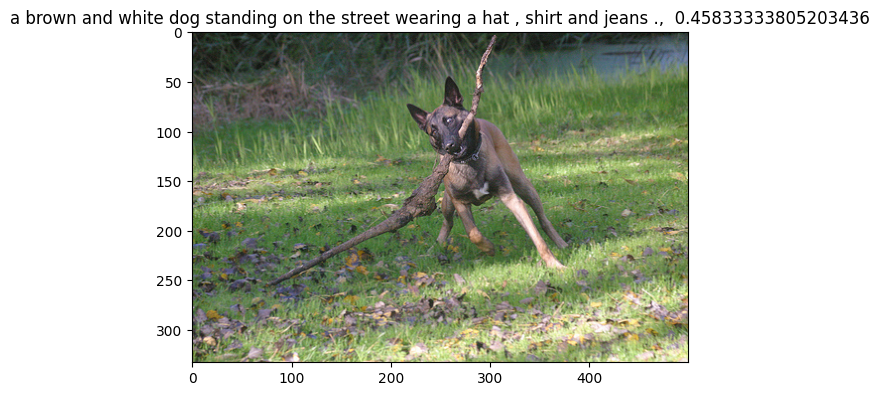

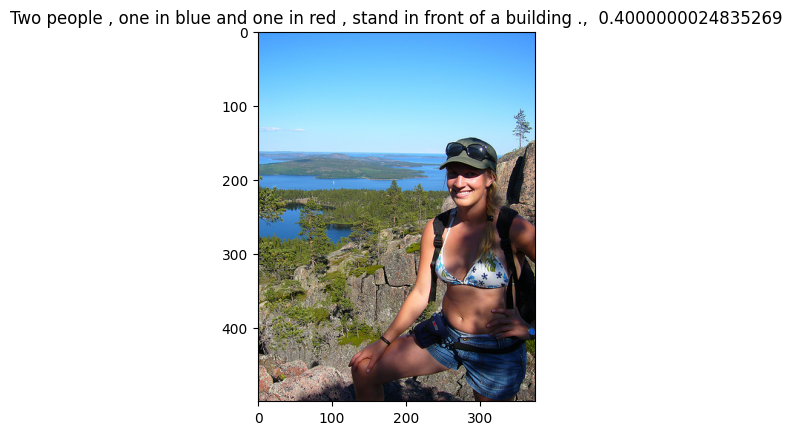

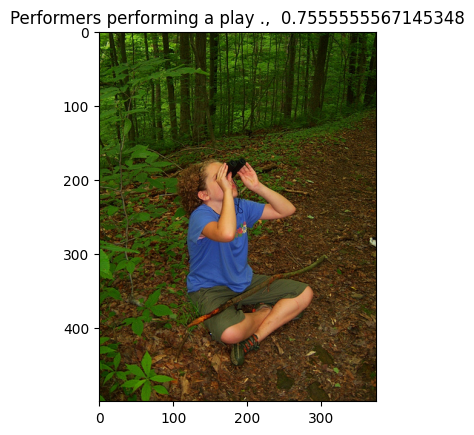

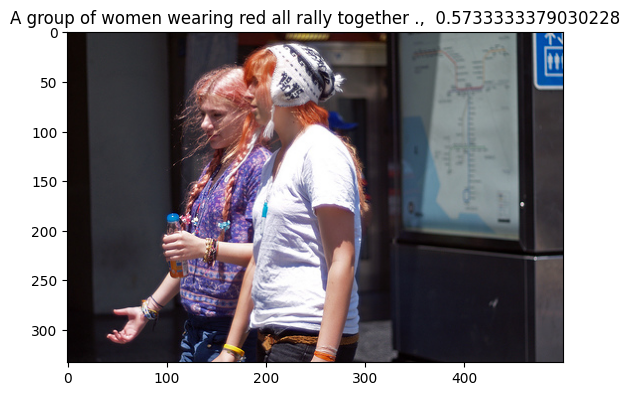

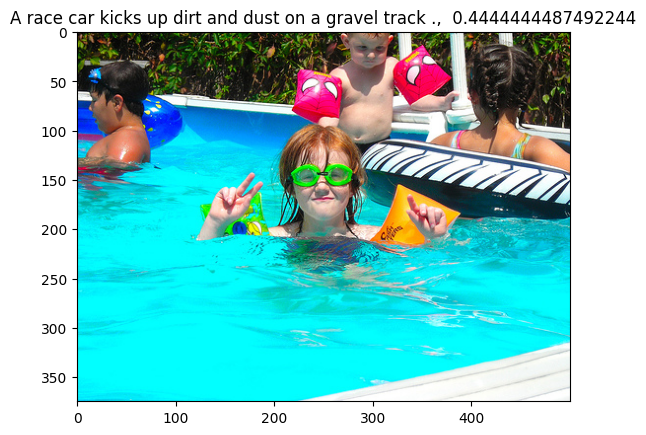

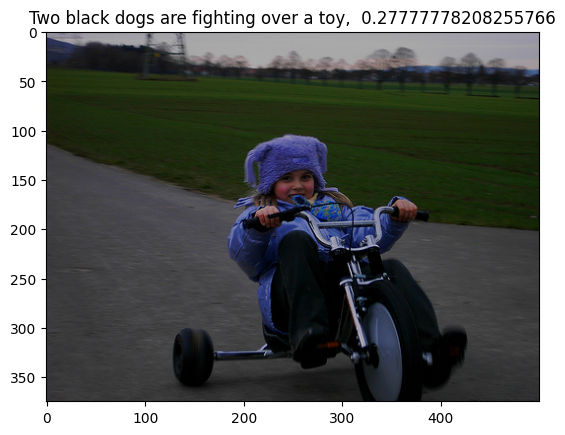

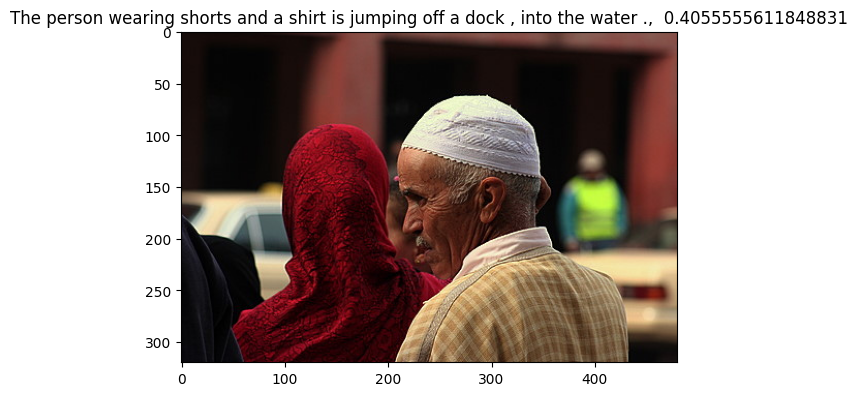

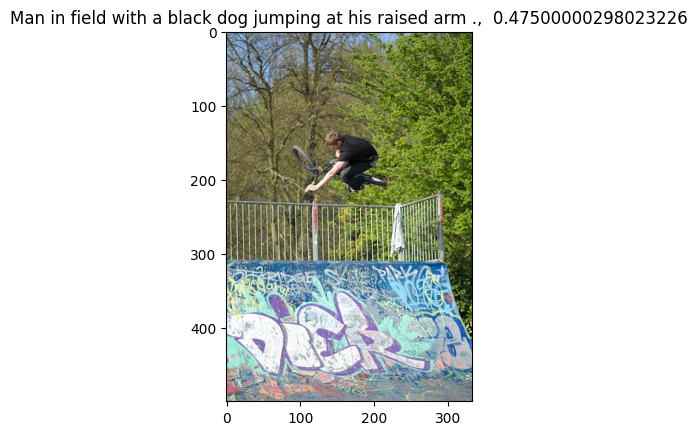

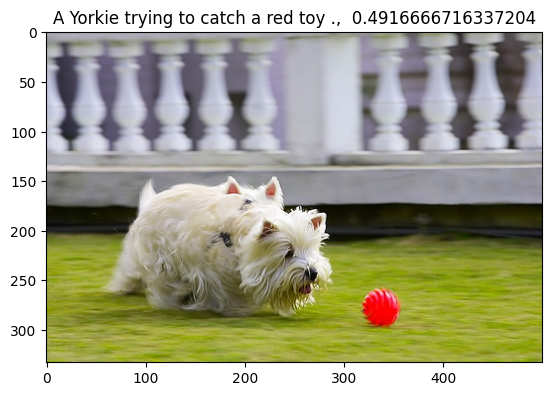

In [ ]:
for index in range(len(best_img)):
  restricted_img = '''
    _______________________________________________________________________


    This image is unavailable in your country in compliance with local laws.

    _______________________________________________________________________

    '''
  if best_img[index] == 'disclaimer':
    print(restricted_img)
  else:
    plt.figure()
    plt.title(selected_texts[index] + ',  ' + str(best_img[index][1]))
    test_images_path = os.path.join(DATA_PATH, 'test_images')
    img = os.path.join(test_images_path, str(best_img[index][0]))
    plt.imshow(Image.open(img))

## 8. Выводы

Несмотря на то, что эмбеддинги, которые получены NLP моделью и CV моделью позволяют кластеризовать изображения и тексты достаточно неплохо, модель плохо выучивает соответствия между текстами и изображениями. Лучшую метрику показала модель случайного леса

При относительно неплохой метрике (0.05 MAE) на тестовом датасете, визуально модель плохо сопоставляет изображения текстам. Возможно, что для этого нужно больше данных или более хитрый процесс обучения.

Кстати, возможно придумать такой процесс: в query ID есть информация о картинке, которой описание соответствует. Можно обучать модель на наборах пар, где положительные пары выбирать из набора, где query_id и изображения совпадают,
а отрицательные пары выбирать случайно.